---

<center><h1><b>
Forest fires detection
</center>

---

<center>

Jakub Mendyk

Mariusz Zalewski

Bartosz Zimończyk
</center>

---

# Introduction

Our project is about bushfires detecting from the linescans - aerial photos in infrared. We are given two datasets:
1. Linescans - dataset provided by Open Data Cube, consisting of aerial photos from Australia, Victoria
2. Fire boundaries - hand-drawn polygons provided by Country Fire Authority from Australia

An example linescan with a fire boundary below:

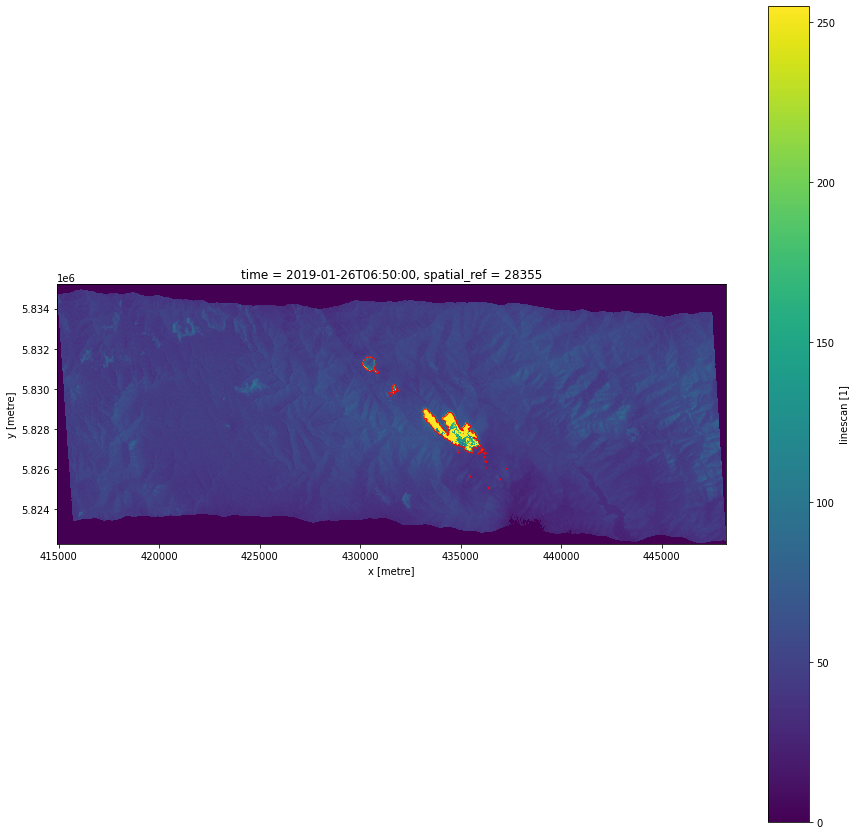

Our aim is to build a model (neural net), able to detect a bushfire from an aerial photo.

Our inspiration came from a contest organised by EY, in which we participated. **It concluded on the 16th of June, we finished at the 32nd place in global ranking (out of 200+ teams) and we were the 3rd best team from Poland!**

All cells with python code below will not work here in Colab, because Open Data Cube needs something more than python libraries like SQL Database etc. We were provided a Virtual Machine prepared by EY for participants. More info [here](https://github.com/EY-Data-Science-Program/2021-Better-Working-World-Data-Challenge/wiki).

# Data

## Imports

In [ ]:
%matplotlib inline
import sys
import numpy as np
import pandas as pd
import geopandas as gpd
from datetime import datetime
from datetime import timedelta

from datacube import Datacube
import matplotlib.pyplot as plt

sys.path.append("../scripts")
from dea_plotting import map_shapefile
from dea_spatialtools import xr_rasterize

## Datasets loading

Here we load linescan dataset:

In [ ]:
dc = Datacube(app="dealing_with_data")

In [ ]:
linescan_datasets = dc.find_datasets(product='linescan')
linescan_datasets = sorted(linescan_datasets, key = lambda ds: (ds.center_time, ds.id))

In [ ]:
len(linescan_datasets)

134

We have 134 linescans.

Now we load dataset consisting of polygons representing fire boundaries:

In [ ]:
vector_file = 'resources/fire_boundaries.shp'
gdf = gpd.read_file(vector_file)
gdf = gdf[gdf.Source == 'Linescan']
gdf

,Source,SourceName,Type,dtString,Comments,dtUTC,dtLocal,ID,event,geometry
0,Linescan,aberfeldy west 200 p1_201901260955_mga94_55.jpg,Initial ignition,2019/01/26 09:55:00.000,originally Latrobe 87 - Jericho - Jim Track,2019-01-25 22:55:00,2019-01-26 09:55:00,0,Latrobe86,"POLYGON ((431455.605 5829806.837, 431460.570 5..."
1,Linescan,aberfeldy west 200 p1_201901260955_mga94_55.jpg,Initial ignition,2019/01/26 09:55:00.000,originally Latrobe 86 - Jericho - Thomson - Jo...,2019-01-25 22:55:00,2019-01-26 09:55:00,1,Latrobe86,"POLYGON ((433874.449 5827986.798, 433882.377 5..."
2,Linescan,aberfeldy west 200 p1_201901260955_mga94_55.jpg,Initial ignition,2019/01/26 09:55:00.000,originally Latrobe 85 - Jericho - Cream Can Hill,2019-01-25 22:55:00,2019-01-26 09:55:00,2,Latrobe86,"POLYGON ((430459.914 5831285.492, 430457.641 5..."
3,Linescan,aberfeldy west 214 p1_201901261750_mga94_55.jpg,Spot,2019/01/26 17:50:00.000,originally Latrobe 87 - Jericho - Jim Track,2019-01-26 06:50:00,2019-01-26 17:50:00,3,Latrobe86,"POLYGON ((431937.376 5829943.371, 431941.068 5..."
4,Linescan,aberfeldy west 214 p1_201901261750_mga94_55.jpg,Main run,2019/01/26 17:50:00.000,originally Latrobe 87 - Jericho - Jim Track,2019-01-26 06:50:00,2019-01-26 17:50:00,4,Latrobe86,"POLYGON ((431541.651 5829804.025, 431547.139 5..."
...,...,...,...,...,...,...,...,...,...,...
971,Linescan,yarra51 809 p1_201903161558_mga94_55.jpg,Backburn,2019/03/16 15:58:00.000,None,2019-03-16 04:58:00,2019-03-16 15:58:00,2254,Yarra51,"POLYGON ((400246.624 5838321.274, 400254.524 5..."
972,Linescan,yarra51 809 p1_201903161558_mga94_55.jpg,Spot,2019/03/16 15:58:00.000,None,2019-03-16 04:58:00,2019-03-16 15:58:00,2255,Yarra51,"POLYGON ((400442.749 5839677.640, 400409.760 5..."
973,Linescan,yarra51 809 p1_201903161558_mga94_55.jpg,Backburn,2019/03/16 15:58:00.000,None,2019-03-16 04:58:00,2019-03-16 15:58:00,2256,Yarra51,"POLYGON ((400104.351 5838696.227, 400104.396 5..."
974,Linescan,yarra51 809 p1_201903161558_mga94_55.jpg,Main run,2019/03/16 15:58:00.000,Final scan withfire activity,2019-03-16 04:58:00,2019-03-16 15:58:00,2257,Yarra51,"POLYGON ((404476.742 5834053.367, 404473.745 5..."


Since names of linescans corresponding to polygons are in little bit different format from names in linescan dataset, we had to build a function converting names. With this function we create another column in polygon dataset, with names in the same format as in linescan dataset.

In [ ]:
def clean_name(name):
    if name is None:
        res = None
    else:
        if name.upper()[-4::] == ".JPG":
            res = name.upper()[:-4].replace(' ','_')
        else:
            res = name.upper().replace(' ','_')
    return res

In [ ]:
gdf['SourceNameClean'] = gdf.apply(lambda row: clean_name(row.SourceName), axis=1)
gdf.dtUTC = gdf.apply(lambda row: datetime.strptime(row.dtUTC, '%Y-%m-%d %H:%M:%S'), axis=1)
gdf.dtLocal = gdf.apply(lambda row: datetime.strptime(row.dtLocal, '%Y-%m-%d %H:%M:%S'), axis=1)

## Matching polygons with linescans

### Direct matching

Now we will try to match polygons to corresponding linescans directly, i.e. using linescans names:

In [ ]:
direct_matches = pd.DataFrame()
for i in range(len(linescan_datasets)):
    fname = linescan_datasets[i].metadata_doc['label']
    if sum(gdf.SourceNameClean == fname)>0:
        direct_matches = direct_matches.append(pd.DataFrame(np.concatenate((np.array(gdf[gdf.SourceNameClean == fname].ID).reshape(-1,1), np.repeat(i, sum(gdf.SourceNameClean == fname)).reshape(-1,1)), axis=1), columns=['id_pl','id_ls']), ignore_index=True)
print("Mached polygons:", len(direct_matches.id_ls.unique()))
direct_matches

Mached polygons: 37


,id_pl,id_ls
0,0,23
1,1,23
2,2,23
3,3,26
4,4,26
...,...,...
434,2254,133
435,2255,133
436,2256,133
437,2257,133


As we can see above, we have 439 polygons matched with 37 linescans. It means that we have 37 pictures with marked fire boundaries. An example is provided below:

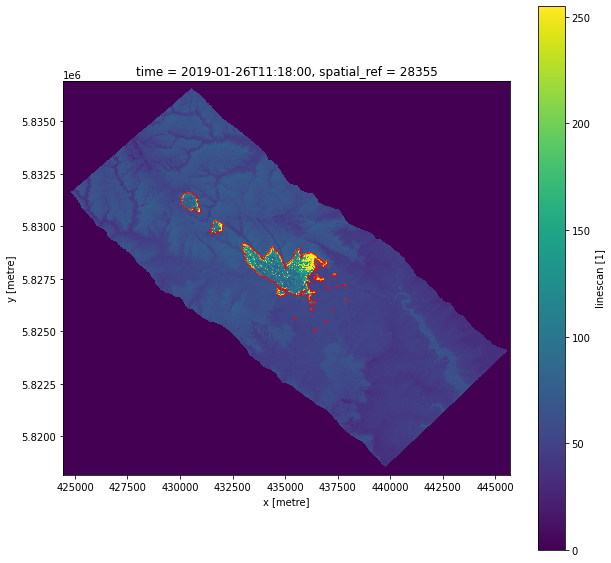

### Composites matching

In previous subsection we have matched polygons with linescans directly, basing on linescans names. In fact, fires in Australia may be such big that more than one linescan is needed to draw boundaries. Here we will match composites - polygons that correpond to more than one linescan.

To extract composites polygons, we have to find names including a word 'composites', ampersand ('&') or comma (',').

In [ ]:
composites = gdf[gdf.SourceName.str.upper().str.contains(",|&|(COMPOSITE)", na=False)]
composites

/env/lib/python3.6/site-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,Source,SourceName,Type,dtString,Comments,dtUTC,dtLocal,ID,event,geometry,SourceNameClean
240,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2051,Walhalla,"POLYGON ((453658.667 5803930.429, 453665.375 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
241,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Main run,2019/02/25 13:40:00.000,poor resolution on scan - fire very quiet - in...,2019-02-25 02:40:00,2019-02-25 13:40:00,2084,Walhalla,"POLYGON ((455929.360 5795742.381, 455923.878 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
242,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2053,Walhalla,"POLYGON ((449321.816 5797497.661, 449310.878 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
315,Linescan,"macalister 681 & 682, (684 & 685 minor) compos...",Spot,2019/03/08 05:19:59.000,None,2019-03-07 18:19:59,2019-03-08 05:19:59,1151,Macalister91,"POLYGON ((488004.969 5843240.937, 488004.818 5...","MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOS..."
316,Linescan,"macalister 681 & 682, (684 & 685 minor) compos...",Spot,2019/03/08 05:19:59.000,None,2019-03-07 18:19:59,2019-03-08 05:19:59,1154,Macalister91,"POLYGON ((496572.570 5844159.446, 496563.396 5...","MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOS..."
...,...,...,...,...,...,...,...,...,...,...,...
826,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2078,Walhalla,"POLYGON ((449597.478 5796850.197, 449597.484 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
827,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2079,Walhalla,"POLYGON ((450473.900 5795683.684, 450469.934 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
828,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2080,Walhalla,"POLYGON ((450636.539 5795529.391, 450651.028 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."
829,Linescan,"Composite wallhalla 397,398 & 401 20190225 (13...",Spot,2019/02/25 13:40:00.000,None,2019-02-25 02:40:00,2019-02-25 13:40:00,2082,Walhalla,"POLYGON ((449872.713 5798234.831, 449882.400 5...","COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13..."


There are not specified any convention of names of composites, so it was hard to match polygons with linescans automatically. Luckily, there are not many composites in our dataset, so we were able to do it manually.

In [ ]:
composites.SourceNameClean.unique()

array(['COMPOSITE_WALLHALLA_397,398_&_401_20190225_(1311_TO_1342HRS)',
       'MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOSITE_0517-0539HRS',
       'COMPOSITE_MACALISTER97_803,_806_&__807_1455-1532HRS',
       'MACALISTER91_751,_752,_755,_760,_761_&_762_COMPOSITE_1549-1730HRS',
       'MACALISTER91_766,767_&_770_COMPOSITE_1239-1314HRS',
       'MACALISTER91_775,_776,_779_&_783_COMPOSITE_1345-1643HRS',
       'MACALISTER91_789,_790_&_793_COMPOSITE_1330-1358HRS',
       'MACALISTER91_804,_805_&_808_COMPOSITE_1503-1539HRS',
       'MACALISTER91_646,648_&_649_COMPOSITE_-_0440HRS_TO_0453HRS',
       'MACALISTER_695,698_&_699_COMPOSITE_1542_-_1610HRS',
       'MACALISTER_696,697,700_-_1545-1613HRS',
       'COMPOSITE_WALLHALLA_380_&_381_20190206_(1347_&_1356HRS)'],
      dtype=object)

In [ ]:
comp_ls = pd.DataFrame()
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('COMPOSITE_WALLHALLA_397,398_&_401_20190225_(1311_TO_1342HRS)',3).reshape(-1,1), np.array([54, 55, 58]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOSITE_0517-0539HRS',2).reshape(-1,1), np.array([80,81]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('COMPOSITE_MACALISTER97_803,_806_&__807_1455-1532HRS',3).reshape(-1,1), np.array([127, 130, 131]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_751,_752,_755,_760,_761_&_762_COMPOSITE_1549-1730HRS',5).reshape(-1,1), np.array([98, 100, 101, 102, 103]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_766,767_&_770_COMPOSITE_1239-1314HRS',3).reshape(-1,1), np.array([106, 107, 110]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_775,_776,_779_&_783_COMPOSITE_1345-1643HRS',5).reshape(-1,1), np.array([116, 123, 128, 129, 132]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_789,_790_&_793_COMPOSITE_1330-1358HRS',3).reshape(-1,1), np.array([119, 120, 123]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_804,_805_&_808_COMPOSITE_1503-1539HRS',3).reshape(-1,1), np.array([128, 129, 132]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER91_646,648_&_649_COMPOSITE_-_0440HRS_TO_0453HRS',3).reshape(-1,1), np.array([75, 76, 77]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER_695,698_&_699_COMPOSITE_1542_-_1610HRS',3).reshape(-1,1), np.array([86, 89, 90]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('MACALISTER_696,697,700_-_1545-1613HRS',3).reshape(-1,1), np.array([87, 88, 91]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)
comp_ls = comp_ls.append(pd.DataFrame(np.concatenate((np.repeat('COMPOSITE_WALLHALLA_380_&_381_20190206_(1347_&_1356HRS)',2).reshape(-1,1), np.array([52,53]).reshape(-1,1)), axis=1), columns=['name','id_ls']), ignore_index=True)

comp_ls.columns = ['SourceNameClean', 'id_ls']
comp_ls

,SourceNameClean,id_ls
0,"COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13...",54
1,"COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13...",55
2,"COMPOSITE_WALLHALLA_397,398_&_401_20190225_(13...",58
3,"MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOS...",80
4,"MACALISTER_681_&_682,_(684_&_685_MINOR)_COMPOS...",81
5,"COMPOSITE_MACALISTER97_803,_806_&__807_1455-15...",127
6,"COMPOSITE_MACALISTER97_803,_806_&__807_1455-15...",130
7,"COMPOSITE_MACALISTER97_803,_806_&__807_1455-15...",131
8,"MACALISTER91_751,_752,_755,_760,_761_&_762_COM...",98
9,"MACALISTER91_751,_752,_755,_760,_761_&_762_COM...",100


In [ ]:
comp_matches = (gdf[['SourceNameClean', 'ID']]).merge(comp_ls, how='right', suffixes=('_comp','_orig'))
comp_matches.loc[comp_matches.SourceNameClean == 'MACALISTER91_775,_776,_779_&_783_COMPOSITE_1345-1643HRS']

,SourceNameClean,ID,id_ls
408,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1217,116
409,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1218,116
410,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1219,116
411,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1220,116
412,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1222,116
413,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1223,116
414,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1217,123
415,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1218,123
416,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1219,123
417,"MACALISTER91_775,_776,_779_&_783_COMPOSITE_134...",1220,123


In [ ]:
comp_matches = comp_matches[['ID','id_ls']]
comp_matches.columns = direct_matches.columns
comp_matches

,id_pl,id_ls
0,2051,54
1,2084,54
2,2053,54
3,2017,54
4,2018,54
...,...,...
793,2012,53
794,2013,53
795,2014,53
796,2015,53


In [ ]:
all_matches = direct_matches.append(comp_matches, ignore_index = True)

In [ ]:
len(all_matches.id_ls.unique())

71

After two steps we have 71 linescans with marked fire boundaries.

### Remaining polygons

In [ ]:
rem = gdf.loc[~gdf.ID.isin(direct_matches.id_pl)]
rem = rem.loc[~rem.ID.isin(composites.ID)]
rem.SourceNameClean.unique()

array(['JORDAN_261_P1_201901301434_MGA94_55',
       'JORDAN_262_P1_201901301450_MGA94_55',
       'JORDAN_263_P1_201901301505_MGA94_55',
       'JORDAN_265_P1_201901301537_MGA94_55',
       'JORDAN_267_P1_201901301604_MGA94_55',
       'MACALISTER96_97_625_P1_201903051919_MGA94_55',
       'JORDAN_370_P1_201902040638_MGA94_55',
       'JORDAN_382_P1_201902061407_MGA94_55',
       'WALHALLA_414_P1_201902262006_MGA94_55.JPG_(X_REF_WITH_WALHALLA_406_0548HRS)'],
      dtype=object)

Since there are not many groups of polygons for which we have no linescans, we will try to match these boundaries to linescans of same area but from differen time. 

In [ ]:
rem_matches = pd.DataFrame()
rem_matches = rem_matches.append(pd.DataFrame(np.concatenate((np.array(['JORDAN_261_P1_201901301434_MGA94_55', 'JORDAN_262_P1_201901301450_MGA94_55', 'JORDAN_263_P1_201901301505_MGA94_55','JORDAN_265_P1_201901301537_MGA94_55','JORDAN_267_P1_201901301604_MGA94_55']).reshape(-1,1), np.repeat(33,5).reshape(-1,1)), axis=1), columns=['SourceNameClean','id_ls']), ignore_index=True)
rem_matches = rem_matches.append(pd.DataFrame(np.concatenate((np.repeat('WALHALLA_414_P1_201902262006_MGA94_55.JPG_(X_REF_WITH_WALHALLA_406_0548HRS)',3).reshape(-1,1), np.array([58, 60, 61]).reshape(-1,1)), axis=1), columns=['SourceNameClean','id_ls']), ignore_index=True)
rem_matches

,SourceNameClean,id_ls
0,JORDAN_261_P1_201901301434_MGA94_55,33
1,JORDAN_262_P1_201901301450_MGA94_55,33
2,JORDAN_263_P1_201901301505_MGA94_55,33
3,JORDAN_265_P1_201901301537_MGA94_55,33
4,JORDAN_267_P1_201901301604_MGA94_55,33
5,WALHALLA_414_P1_201902262006_MGA94_55.JPG_(X_R...,58
6,WALHALLA_414_P1_201902262006_MGA94_55.JPG_(X_R...,60
7,WALHALLA_414_P1_201902262006_MGA94_55.JPG_(X_R...,61


In [ ]:
rem_matches = (gdf[['SourceNameClean', 'ID']]).merge(rem_matches, how='right', suffixes=('_comp','_orig'))
rem_matches = rem_matches[['ID', 'id_ls']]
rem_matches.columns = direct_matches.columns

In [ ]:
rem_matches

,id_pl,id_ls
0,436,33
1,437,33
2,438,33
3,440,33
4,441,33
...,...,...
315,2146,61
316,2147,61
317,2148,61
318,2149,61


In [ ]:
all_matches = all_matches.append(rem_matches, ignore_index = True)

In [ ]:
len(all_matches.id_ls.unique())

74

Finally we have 74 pictures with marked fire boundaries.

## Cleaning the data

### Boundaries outside of linescans

During data preparation we have noticed that sometimes boundaries are outside of photographed area, as in example below: 

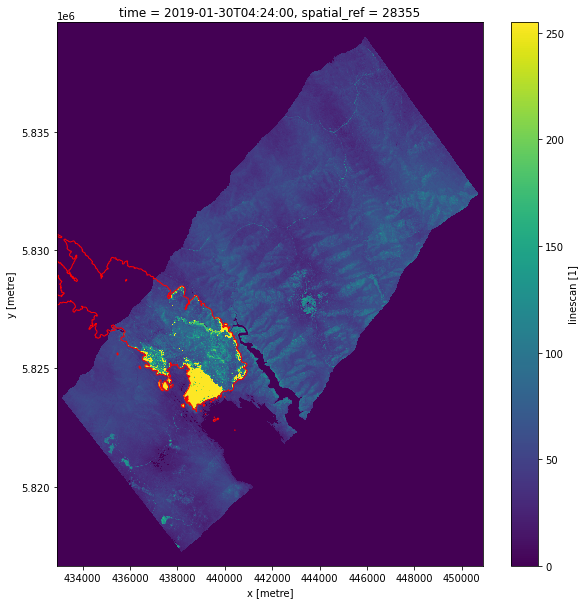

Due to this, target was affected as below:

Linescan ID: 33
Rasterizing to match xarray.DataArray dimensions (2295, 1799)


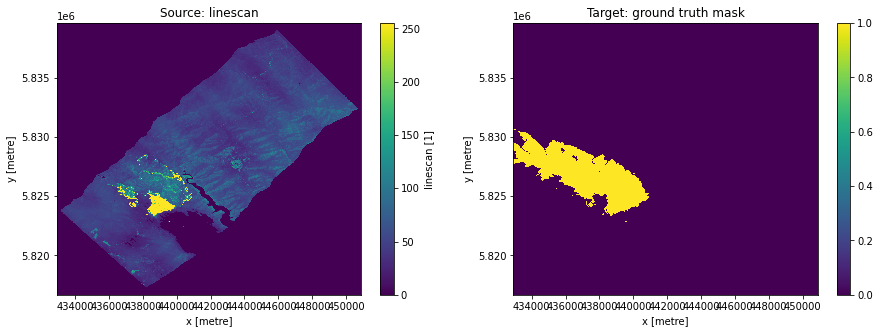

In [ ]:
i = 33
print("Linescan ID:", i)
linescan_id = i
ob = gdf.loc[gdf.ID.isin(direct_matches[direct_matches.id_ls == linescan_id].id_pl)]
#ob = ob.loc[~ob.Comments.str.contains("not in scan", na=False)]
src = dc.load(product='linescan', id=linescan_datasets[linescan_id].id, output_crs='epsg:28355', resolution=(-10,10))
tgt = xr_rasterize(gdf=ob, da=src)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
src.linescan.plot(ax=ax[0])
ax[0].set_title('Source: linescan')
tgt.plot(ax=ax[1])
ax[1].set_title('Target: ground truth mask')
plt.show()

We had to cut the area outside of linescan boundary. The idea is quite simple - colour of pixels outside of linescan is encoded as 0, so in target, pixels that were encoded as 0, should be also encoded as 0. 

Linescan ID: 33
Rasterizing to match xarray.DataArray dimensions (2295, 1799)


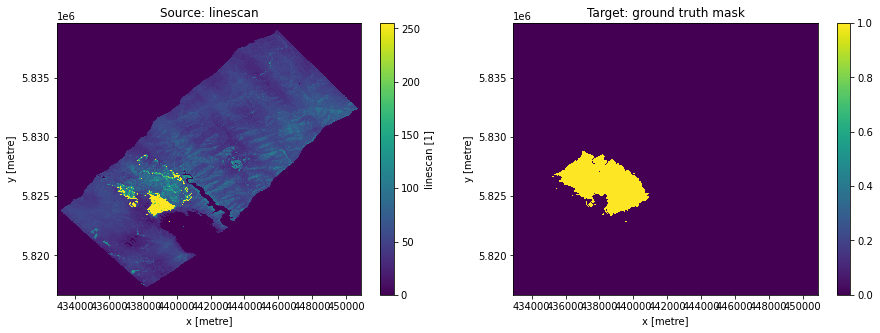

In [ ]:
i = 33
print("Linescan ID:", i)
linescan_id = i
ob = gdf.loc[gdf.ID.isin(direct_matches[direct_matches.id_ls == linescan_id].id_pl)]
src = dc.load(product='linescan', id=linescan_datasets[linescan_id].id, output_crs='epsg:28355', resolution=(-10,10))
tgt = xr_rasterize(gdf=ob, da=src)

# here we cut the area of fire
tgt.values[src.linescan.values[0] == 0] = 0

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
src.linescan.plot(ax=ax[0])
ax[0].set_title('Source: linescan')
tgt.plot(ax=ax[1])
ax[1].set_title('Target: ground truth mask')
plt.show()

### Picking correct data

Our last step was to look at the linescans and corresponding targets in order to check whether they are correct (i.e. target looks reasonable with respect to corresponding linescan). We simply add to our table with linkages another boolean column 'good', which tells whether linkage polygon-linescan is useful to train models.

Linescan ID: 23
Rasterizing to match xarray.DataArray dimensions (777, 1171)


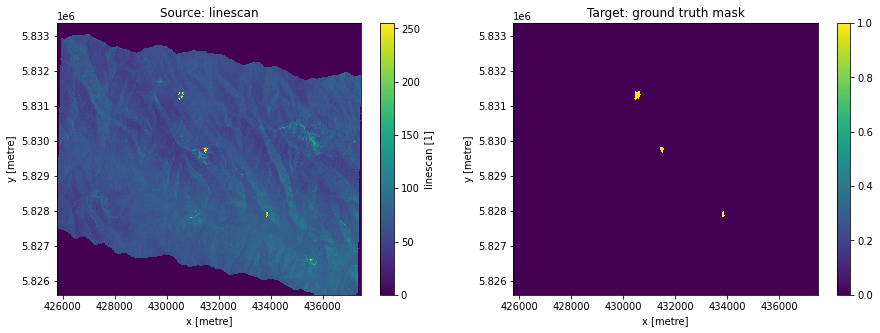

Linescan ID: 26
Rasterizing to match xarray.DataArray dimensions (1297, 3333)


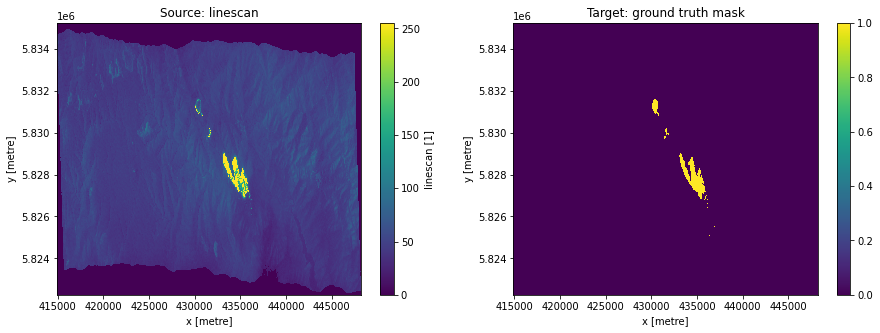

Linescan ID: 27
Rasterizing to match xarray.DataArray dimensions (1873, 2125)


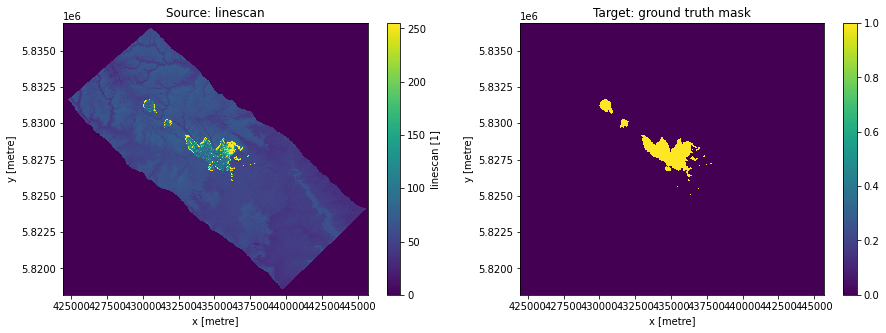

Linescan ID: 29
Rasterizing to match xarray.DataArray dimensions (2052, 2196)


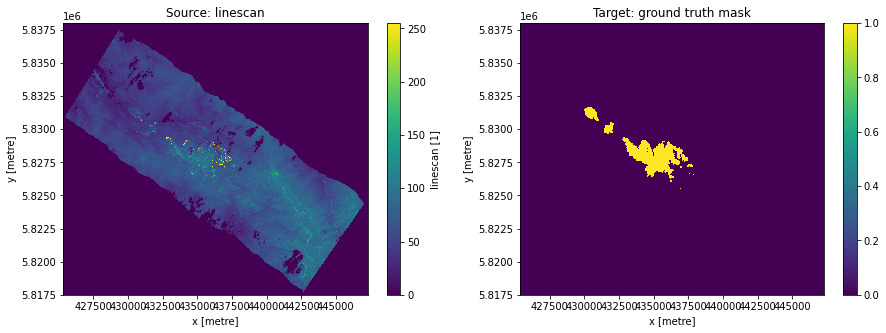

Linescan ID: 31
Rasterizing to match xarray.DataArray dimensions (2022, 2435)


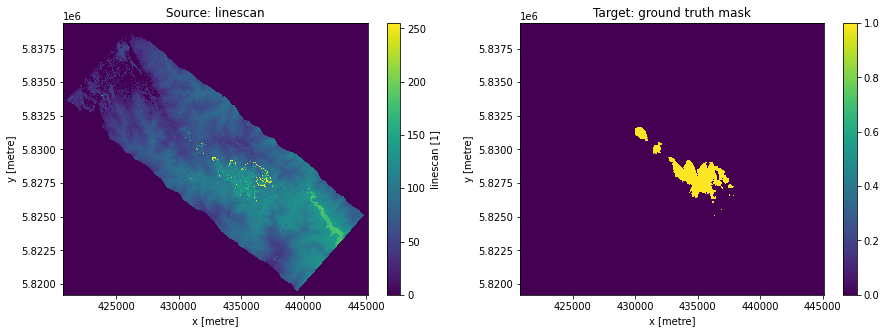

Linescan ID: 33
Rasterizing to match xarray.DataArray dimensions (2295, 1799)


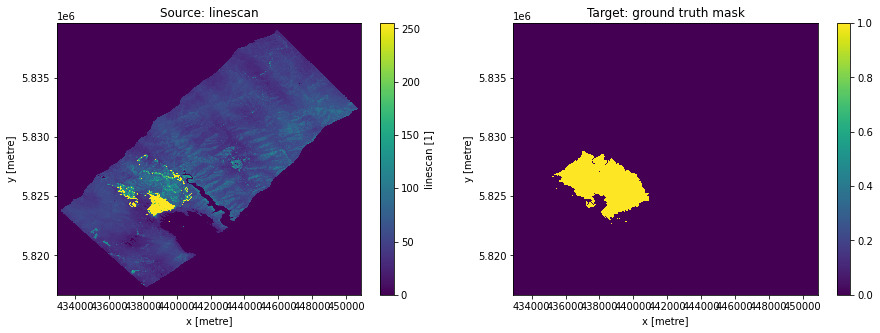

Linescan ID: 34
Rasterizing to match xarray.DataArray dimensions (1908, 2142)


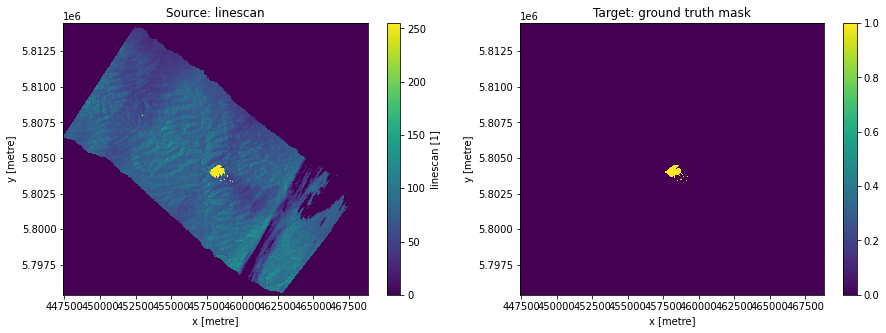

Linescan ID: 35
Rasterizing to match xarray.DataArray dimensions (1963, 2224)


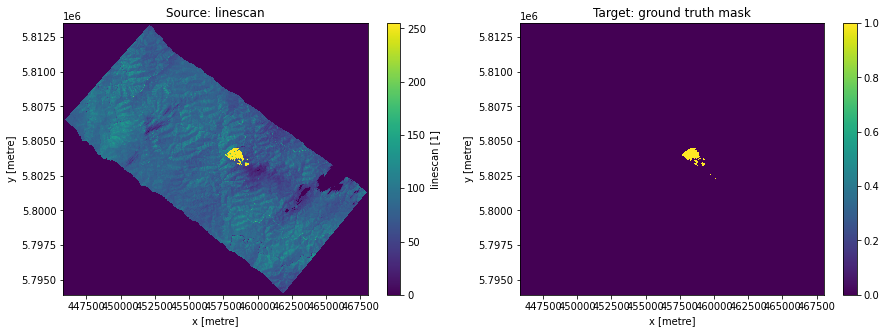

Linescan ID: 38
Rasterizing to match xarray.DataArray dimensions (1753, 1934)


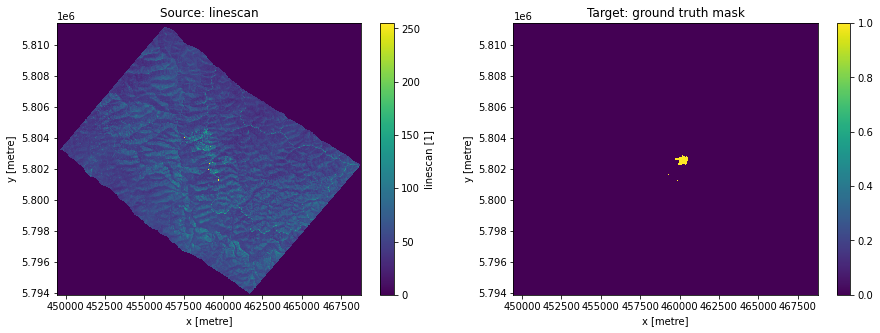

Linescan ID: 39
Rasterizing to match xarray.DataArray dimensions (3314, 1683)


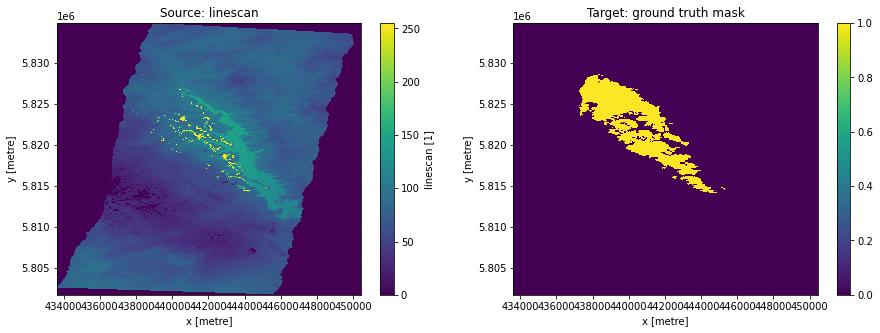

Linescan ID: 41
Rasterizing to match xarray.DataArray dimensions (2440, 2132)


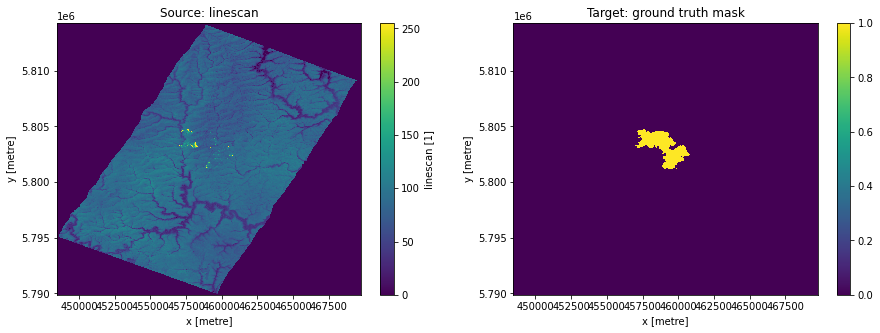

Linescan ID: 50
Rasterizing to match xarray.DataArray dimensions (2847, 2720)


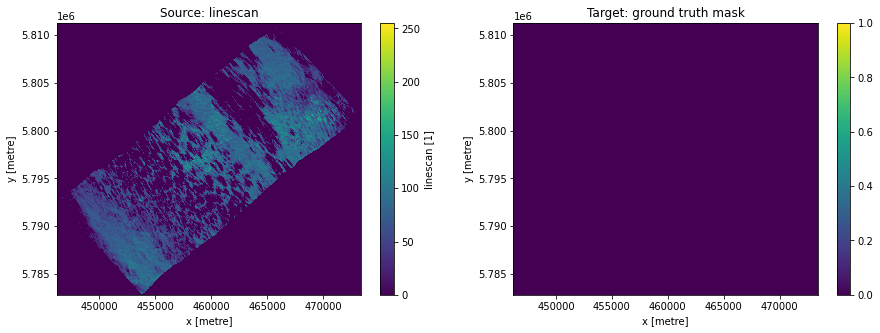

Linescan ID: 65
Rasterizing to match xarray.DataArray dimensions (3509, 3770)


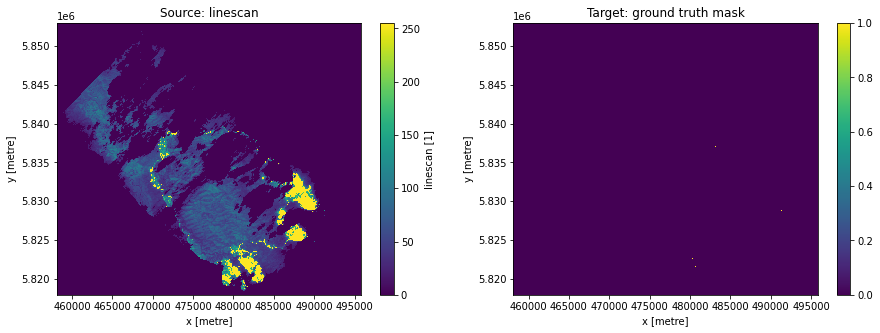

Linescan ID: 69
Rasterizing to match xarray.DataArray dimensions (3981, 2973)


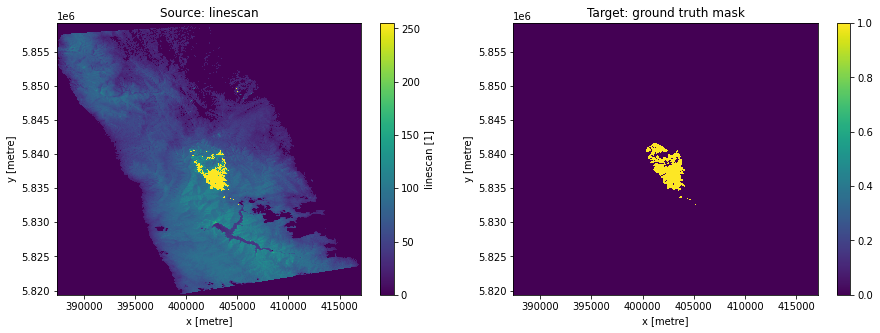

Linescan ID: 72
Rasterizing to match xarray.DataArray dimensions (3736, 3548)


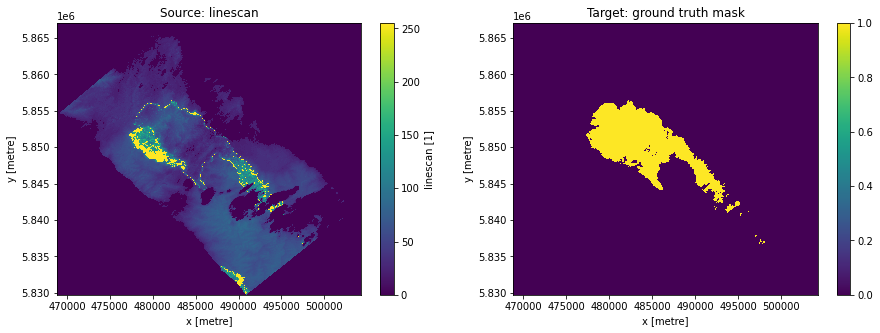

Linescan ID: 73
Rasterizing to match xarray.DataArray dimensions (4124, 3915)


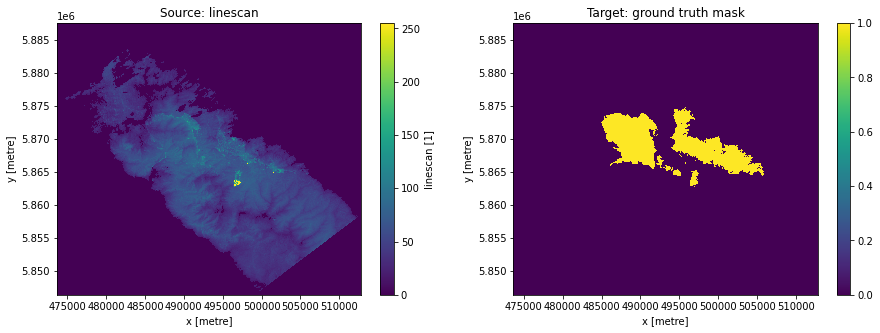

Linescan ID: 74
Rasterizing to match xarray.DataArray dimensions (3531, 2005)


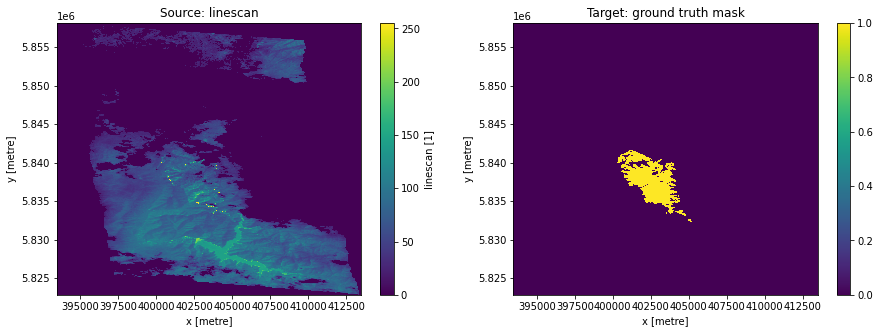

Linescan ID: 79
Rasterizing to match xarray.DataArray dimensions (2855, 2389)


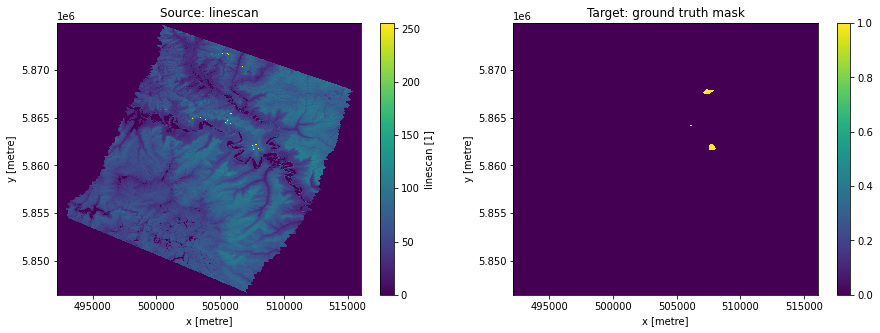

Linescan ID: 82
Rasterizing to match xarray.DataArray dimensions (3075, 2637)


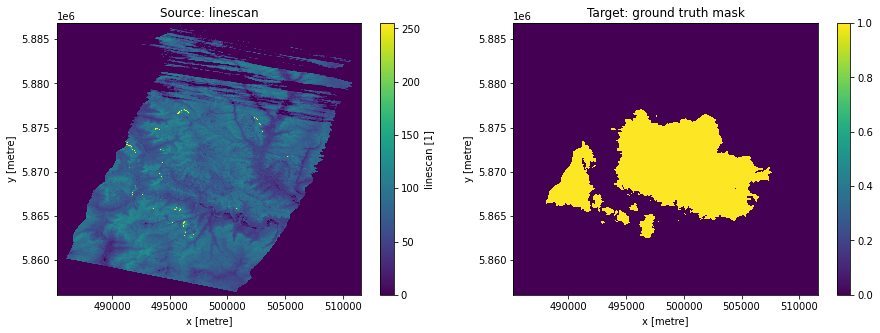

Linescan ID: 87
Rasterizing to match xarray.DataArray dimensions (3313, 2770)


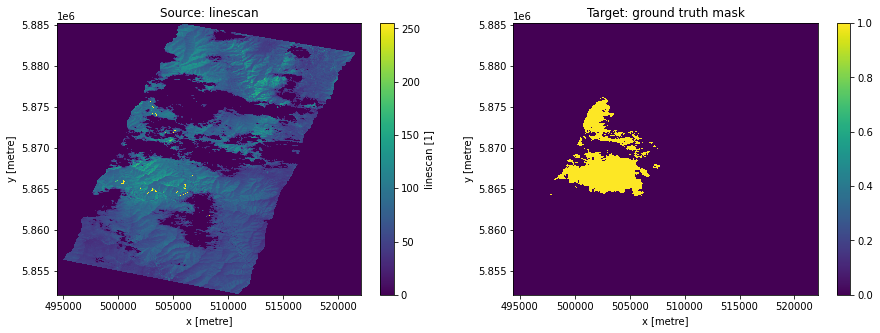

Linescan ID: 88
Rasterizing to match xarray.DataArray dimensions (3924, 2792)


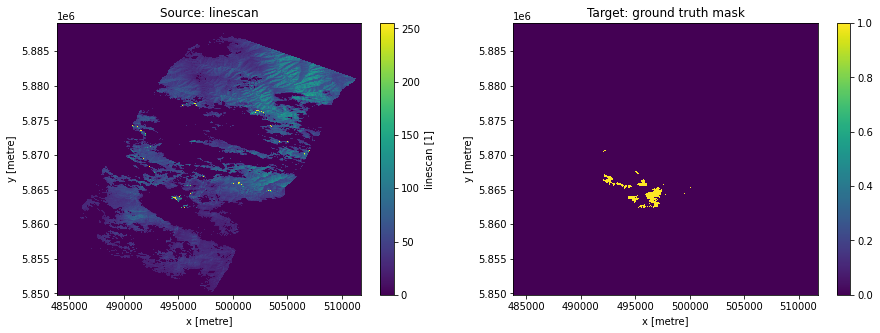

Linescan ID: 91
Rasterizing to match xarray.DataArray dimensions (2864, 2625)


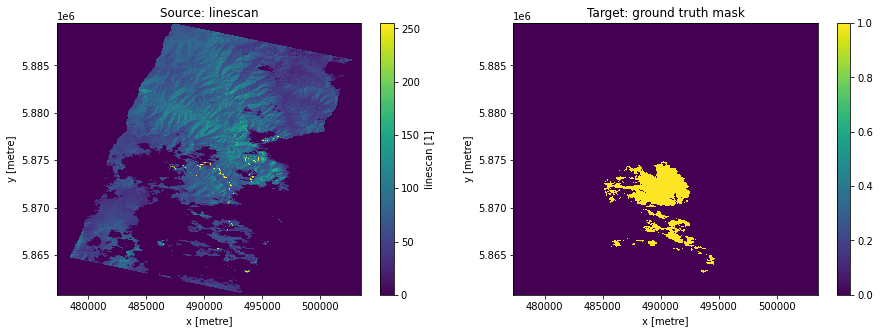

Linescan ID: 92
Rasterizing to match xarray.DataArray dimensions (3164, 2068)


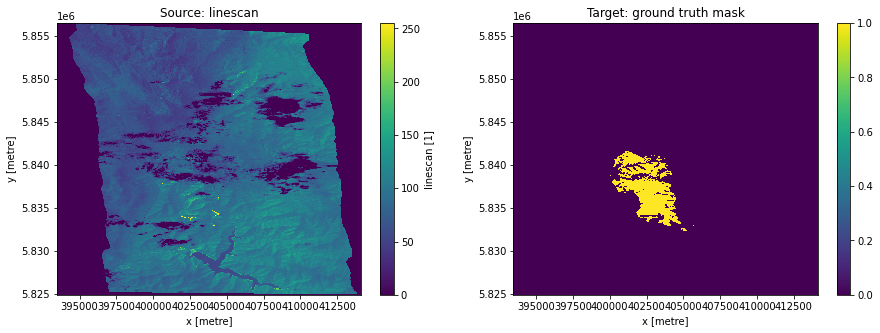

Linescan ID: 94
Rasterizing to match xarray.DataArray dimensions (4447, 3094)


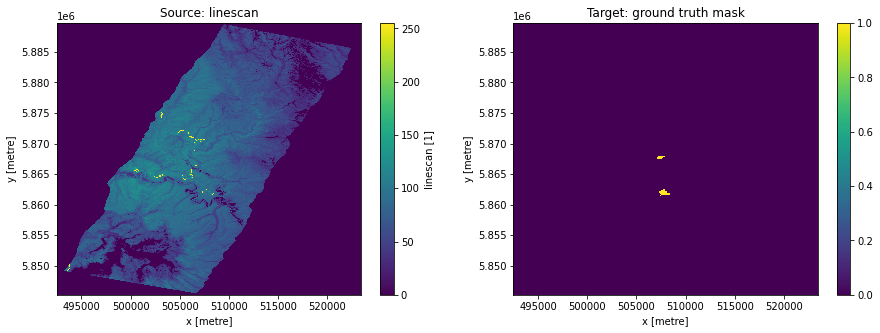

Linescan ID: 95
Rasterizing to match xarray.DataArray dimensions (2844, 2291)


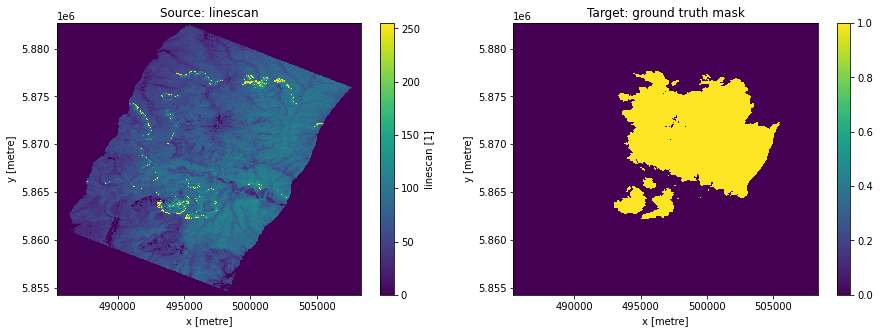

Linescan ID: 96
Rasterizing to match xarray.DataArray dimensions (3512, 2711)


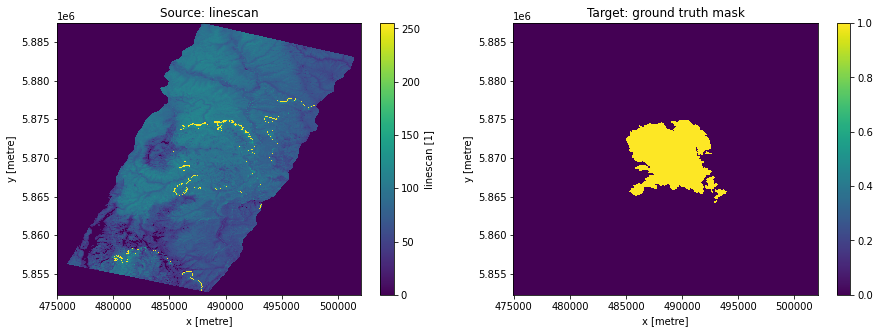

Linescan ID: 97
Rasterizing to match xarray.DataArray dimensions (3416, 1878)


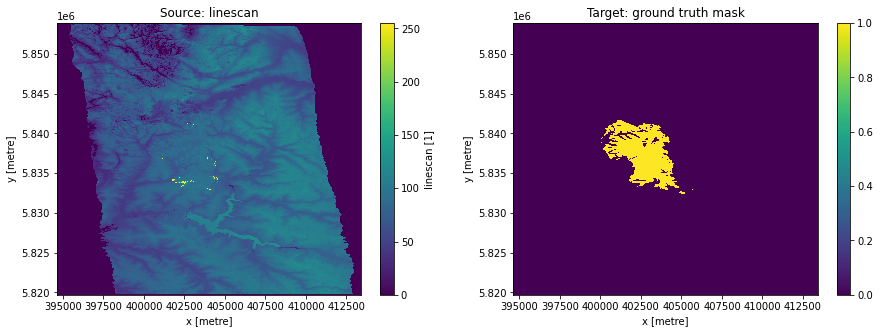

Linescan ID: 105
Rasterizing to match xarray.DataArray dimensions (3210, 2264)


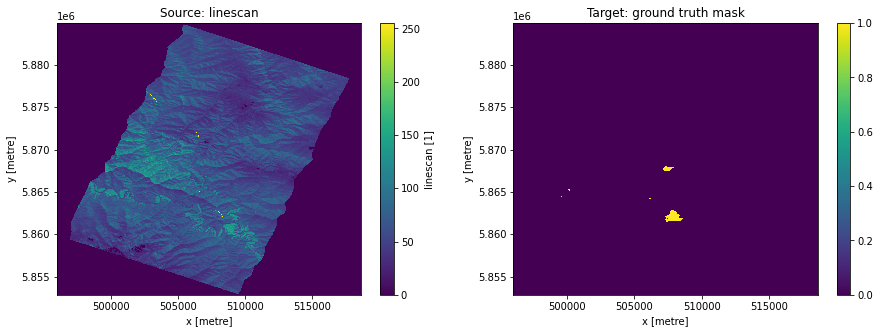

Linescan ID: 108
Rasterizing to match xarray.DataArray dimensions (3049, 2434)


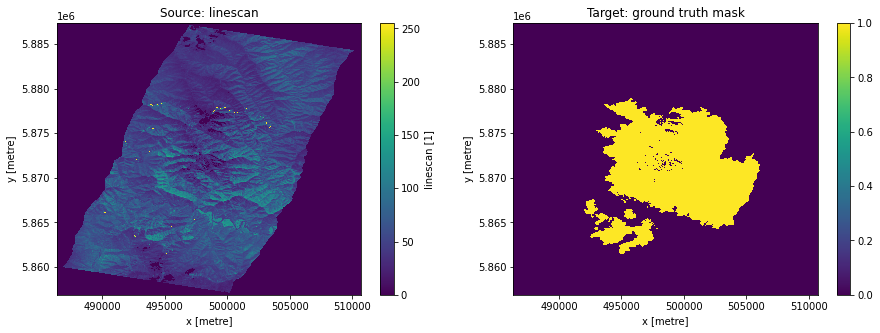

Linescan ID: 109
Rasterizing to match xarray.DataArray dimensions (3052, 2171)


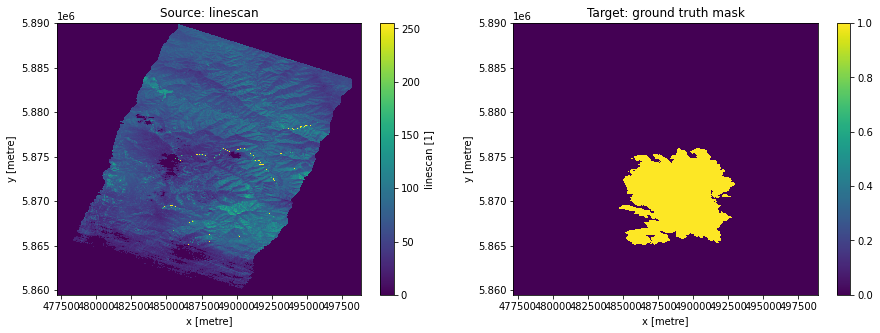

Linescan ID: 112
Rasterizing to match xarray.DataArray dimensions (3127, 2378)


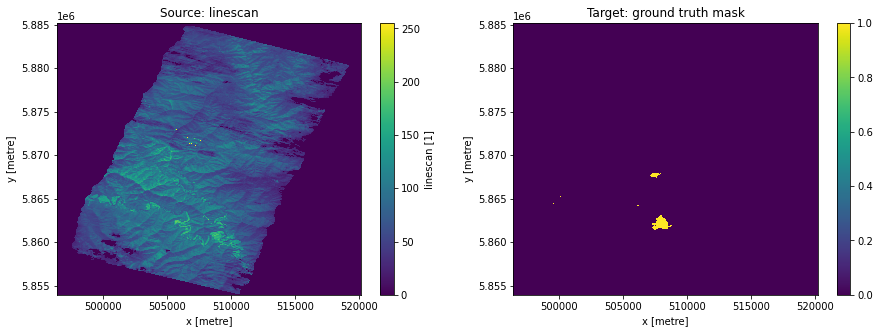

Linescan ID: 113
Rasterizing to match xarray.DataArray dimensions (3266, 2371)


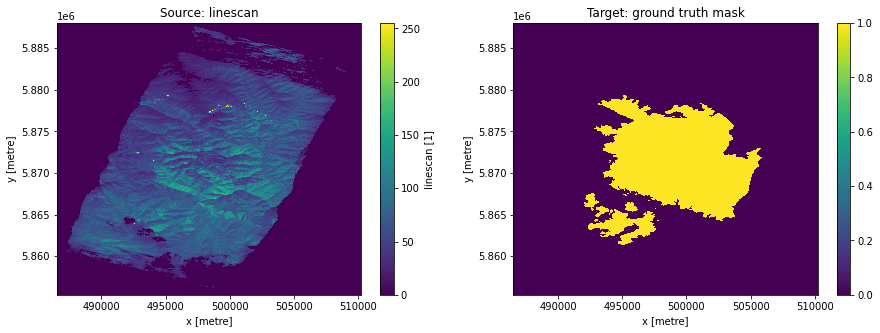

Linescan ID: 114
Rasterizing to match xarray.DataArray dimensions (3132, 2352)


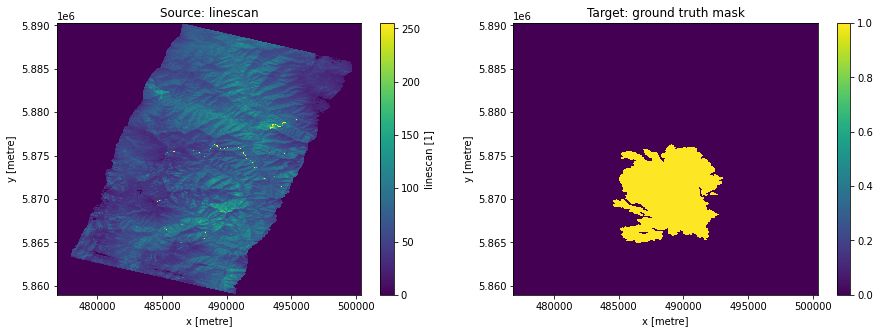

Linescan ID: 118
Rasterizing to match xarray.DataArray dimensions (3002, 2469)


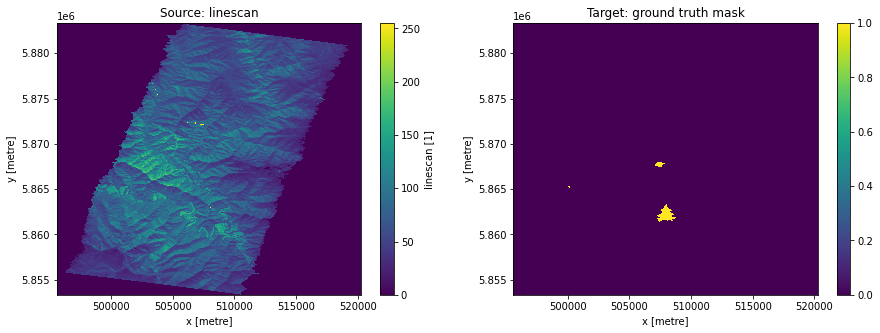

Linescan ID: 121
Rasterizing to match xarray.DataArray dimensions (3483, 2252)


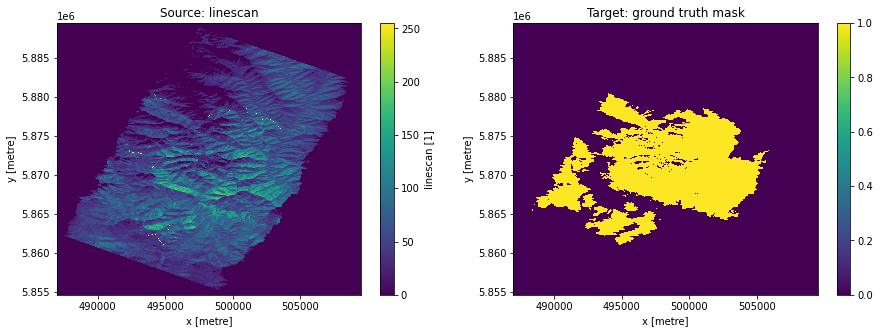

Linescan ID: 124
Rasterizing to match xarray.DataArray dimensions (3381, 1795)


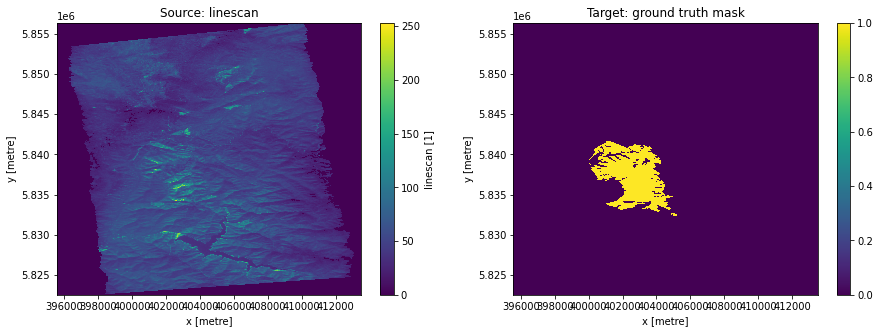

Linescan ID: 133
Rasterizing to match xarray.DataArray dimensions (3344, 1848)


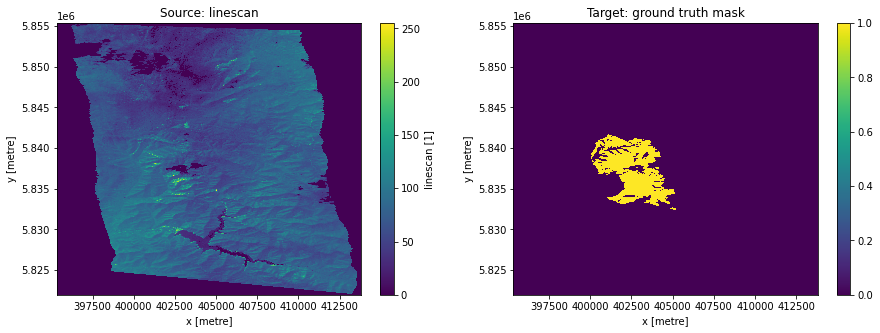

Linescan ID: 54
Rasterizing to match xarray.DataArray dimensions (2461, 2380)


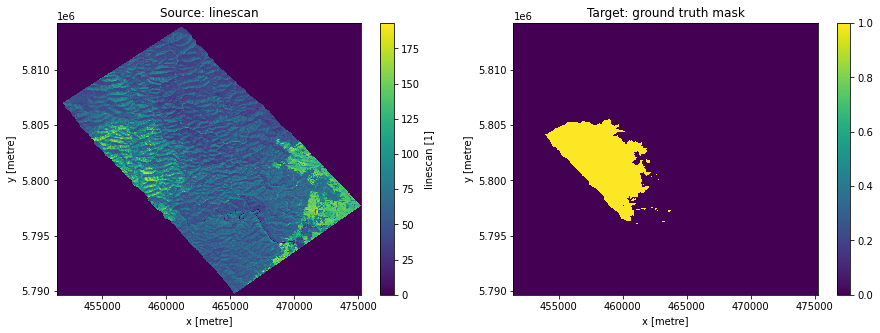

Linescan ID: 55
Rasterizing to match xarray.DataArray dimensions (2580, 2399)


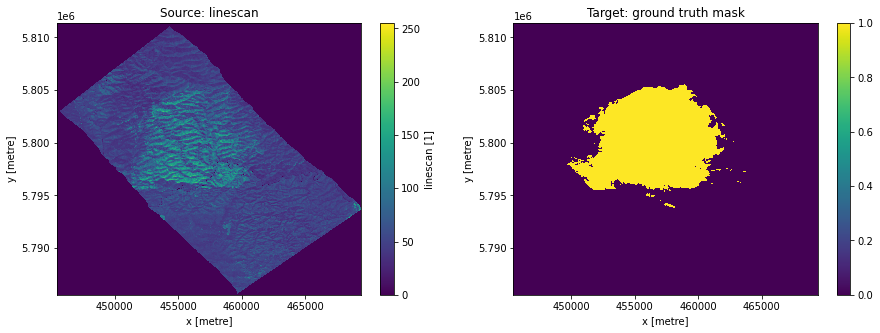

Linescan ID: 58
Rasterizing to match xarray.DataArray dimensions (2396, 2352)


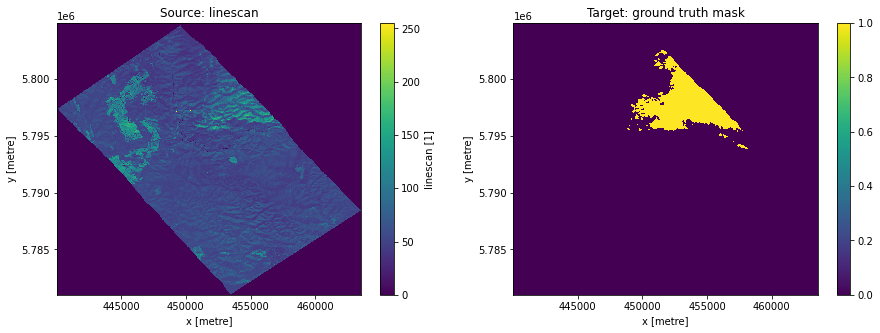

Linescan ID: 80
Rasterizing to match xarray.DataArray dimensions (5321, 3249)


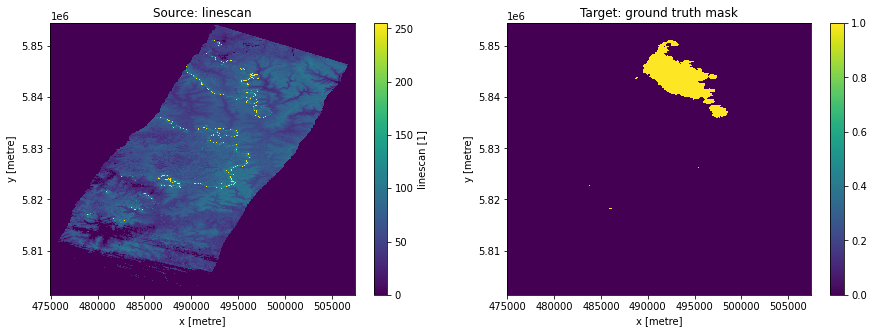

Linescan ID: 81
Rasterizing to match xarray.DataArray dimensions (4779, 3548)


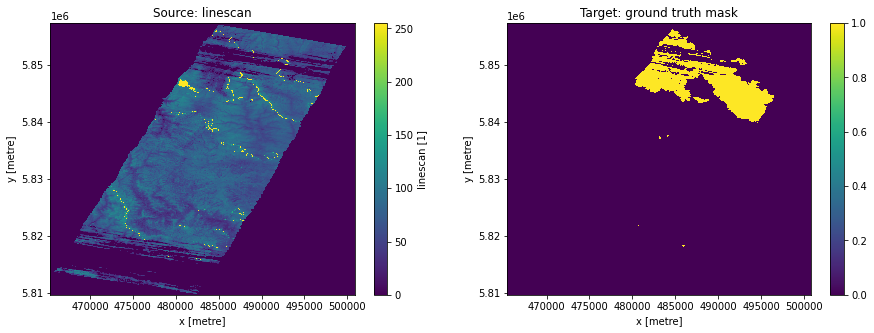

Linescan ID: 127
Rasterizing to match xarray.DataArray dimensions (2706, 2357)


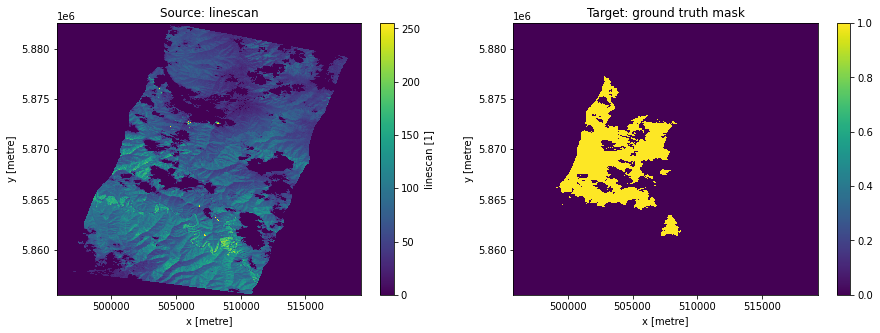

Linescan ID: 130
Rasterizing to match xarray.DataArray dimensions (3305, 2314)


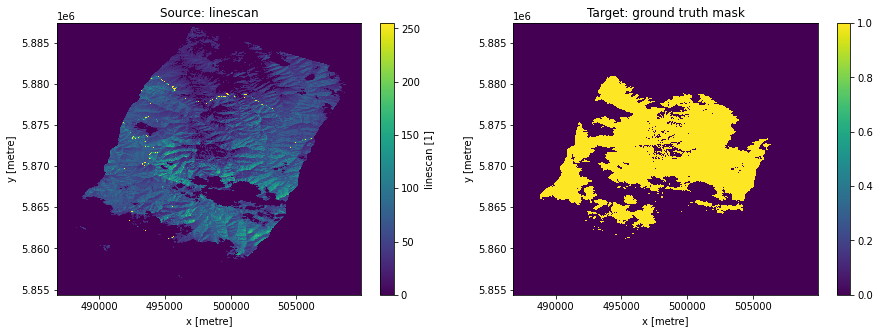

Linescan ID: 131
Rasterizing to match xarray.DataArray dimensions (2703, 2290)


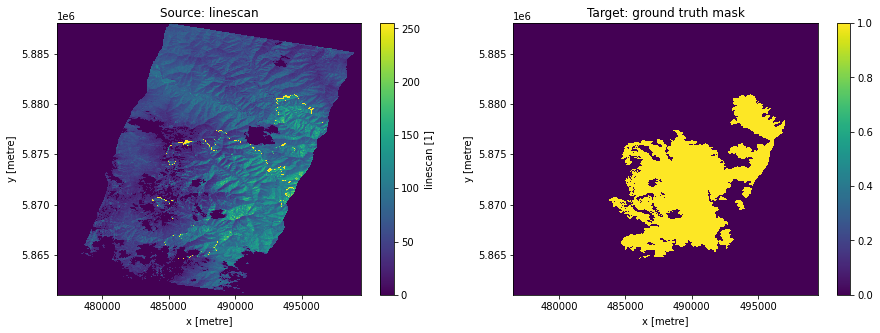

Linescan ID: 98
Rasterizing to match xarray.DataArray dimensions (5700, 3340)


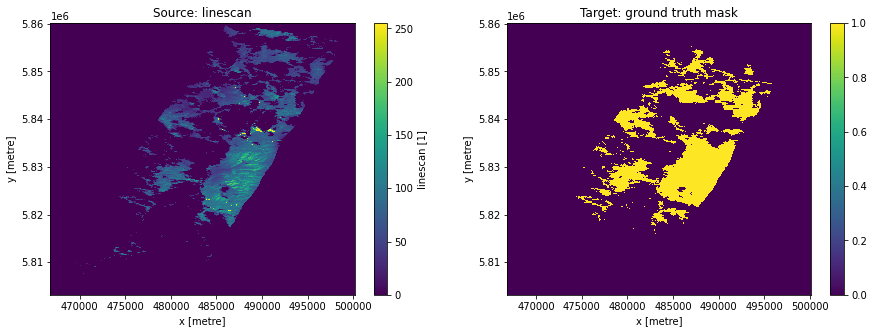

Linescan ID: 100
Rasterizing to match xarray.DataArray dimensions (6009, 3245)


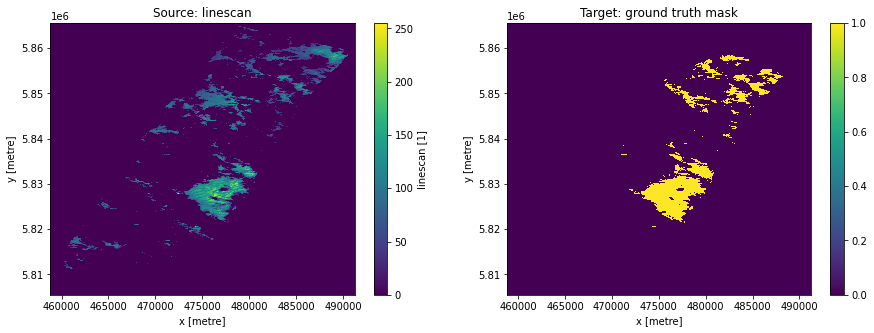

Linescan ID: 101
Rasterizing to match xarray.DataArray dimensions (5799, 3220)


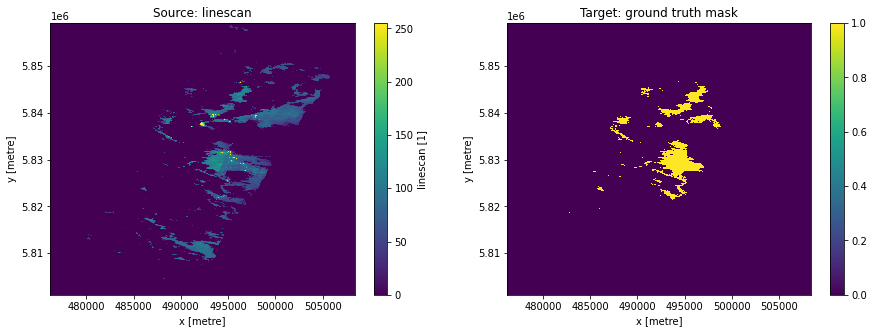

Linescan ID: 102
Rasterizing to match xarray.DataArray dimensions (5791, 3371)


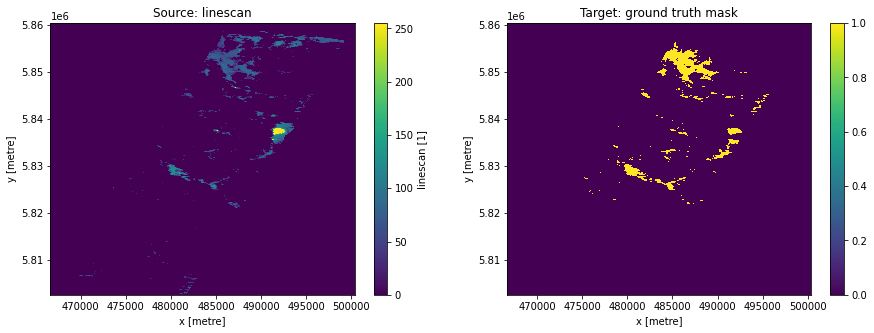

Linescan ID: 103
Rasterizing to match xarray.DataArray dimensions (5945, 3321)


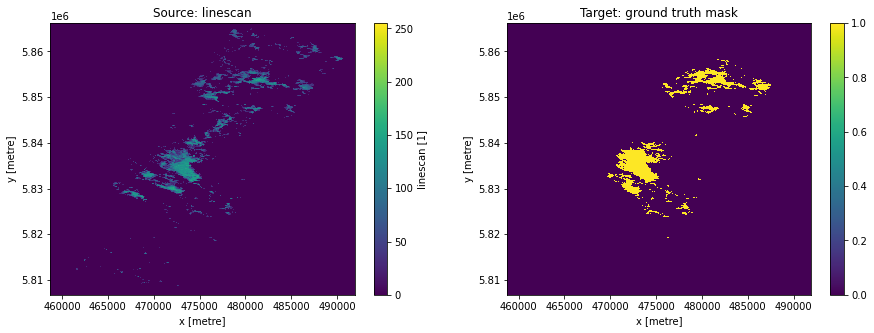

Linescan ID: 106
Rasterizing to match xarray.DataArray dimensions (5821, 3195)


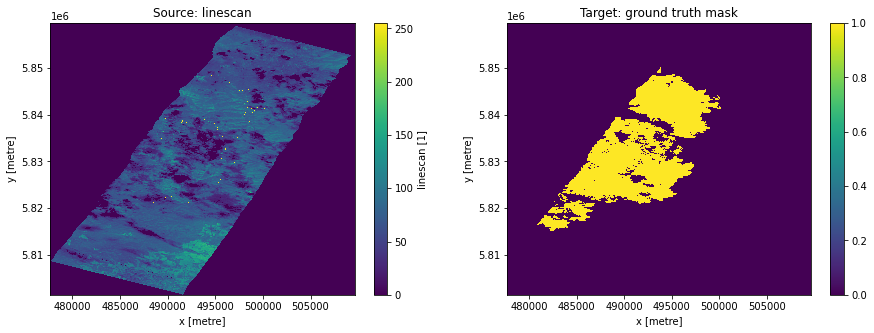

Linescan ID: 107
Rasterizing to match xarray.DataArray dimensions (5300, 3263)


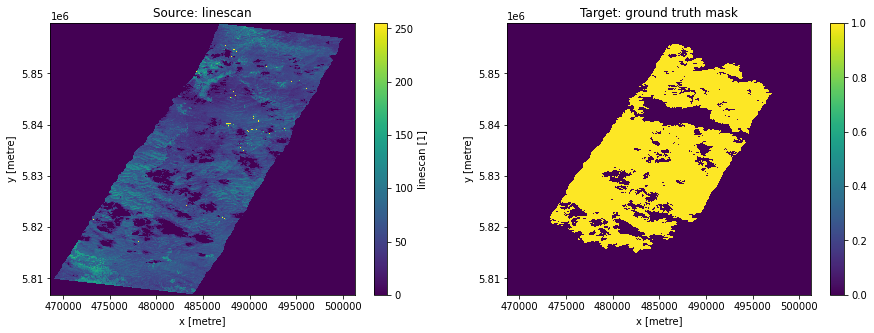

Linescan ID: 110
Rasterizing to match xarray.DataArray dimensions (5660, 3086)


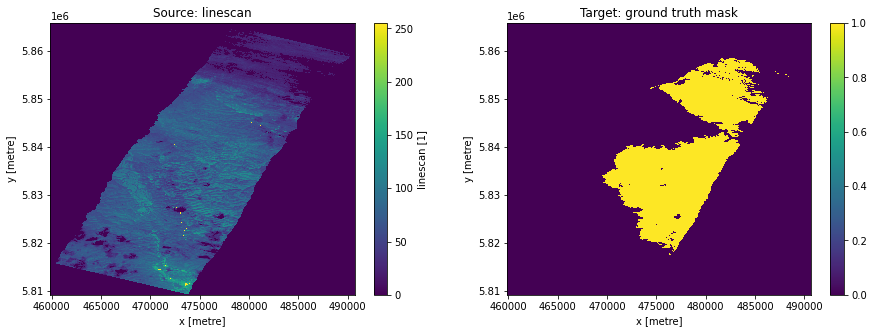

Linescan ID: 116
Rasterizing to match xarray.DataArray dimensions (5384, 3074)


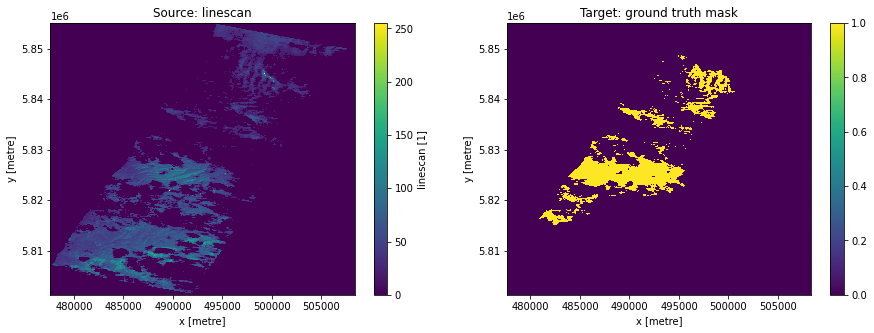

Linescan ID: 123
Rasterizing to match xarray.DataArray dimensions (5255, 3327)


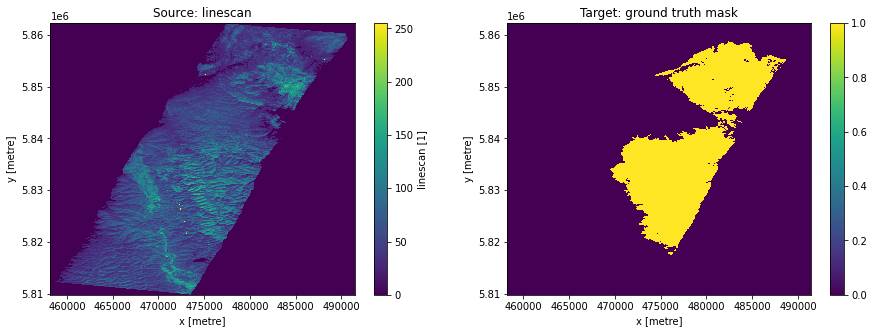

Linescan ID: 128
Rasterizing to match xarray.DataArray dimensions (5355, 3357)


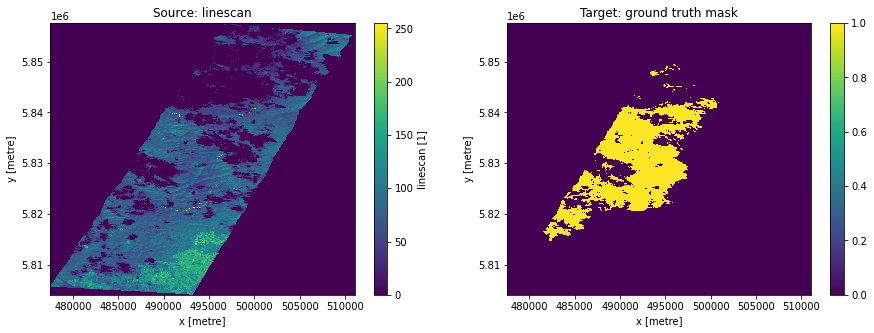

Linescan ID: 129
Rasterizing to match xarray.DataArray dimensions (5681, 3038)


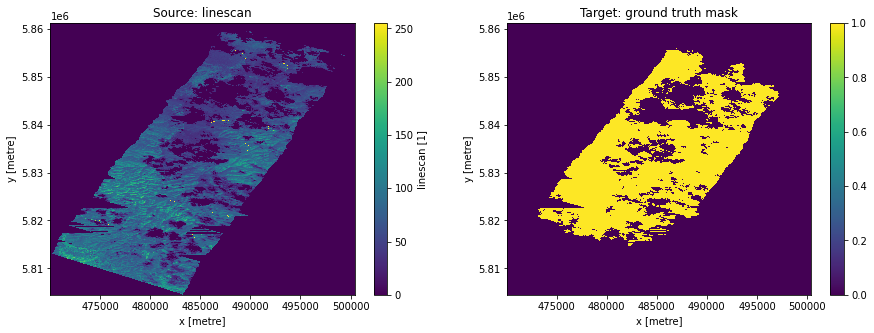

Linescan ID: 132
Rasterizing to match xarray.DataArray dimensions (5105, 3270)


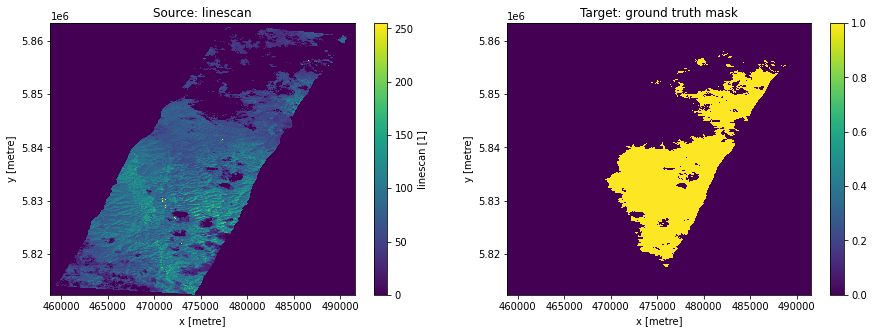

Linescan ID: 119
Rasterizing to match xarray.DataArray dimensions (5275, 3305)


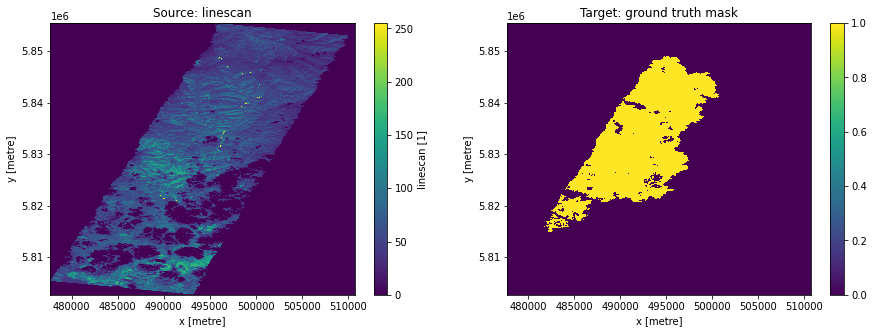

Linescan ID: 120
Rasterizing to match xarray.DataArray dimensions (5867, 3133)


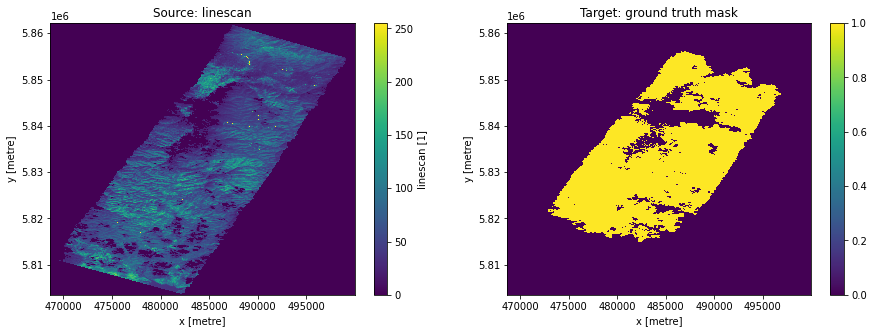

Linescan ID: 75
Rasterizing to match xarray.DataArray dimensions (2526, 2144)


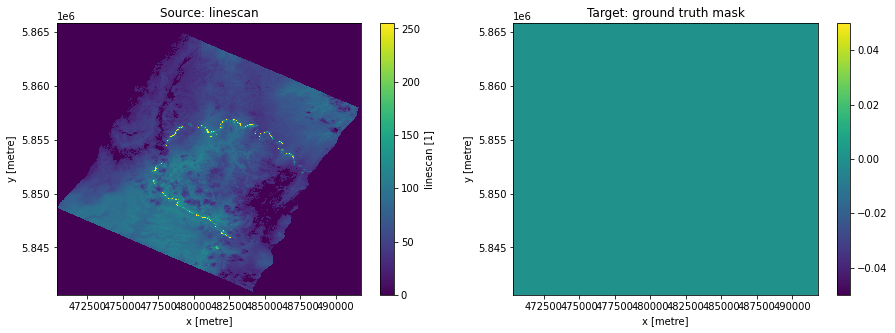

Linescan ID: 76
Rasterizing to match xarray.DataArray dimensions (3584, 2623)


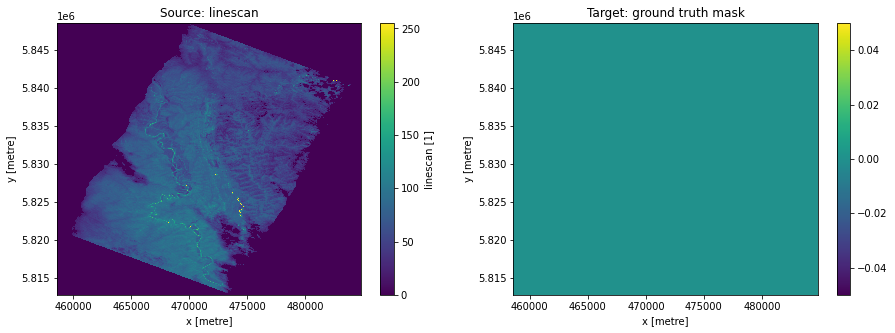

Linescan ID: 77
Rasterizing to match xarray.DataArray dimensions (4729, 3534)


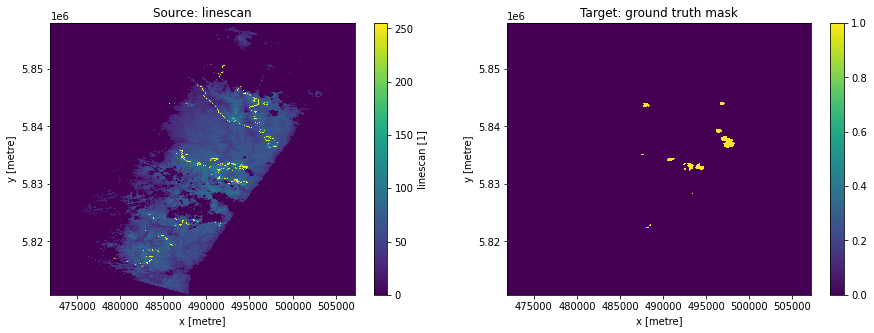

Linescan ID: 86
Rasterizing to match xarray.DataArray dimensions (5084, 3663)


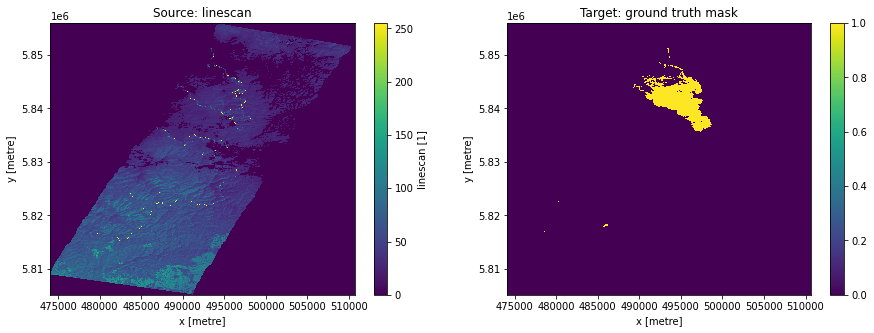

Linescan ID: 89
Rasterizing to match xarray.DataArray dimensions (5221, 3261)


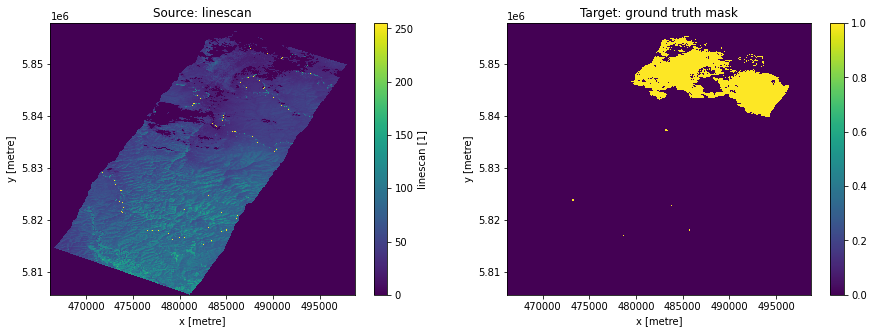

Linescan ID: 90
Rasterizing to match xarray.DataArray dimensions (5223, 3729)


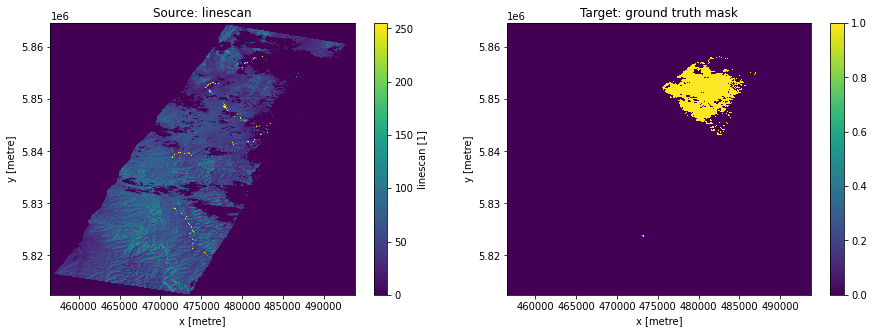

Linescan ID: 52
Rasterizing to match xarray.DataArray dimensions (2792, 2645)


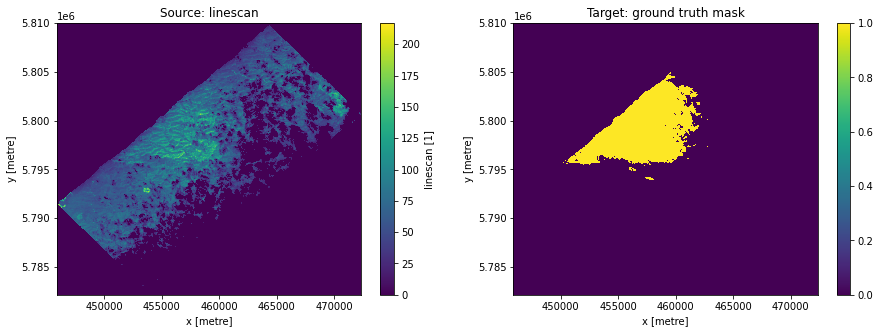

Linescan ID: 53
Rasterizing to match xarray.DataArray dimensions (2818, 2951)


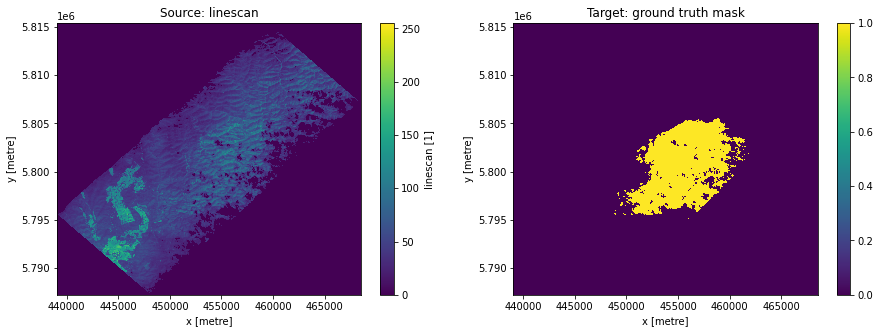

Linescan ID: 60
Rasterizing to match xarray.DataArray dimensions (3347, 3684)


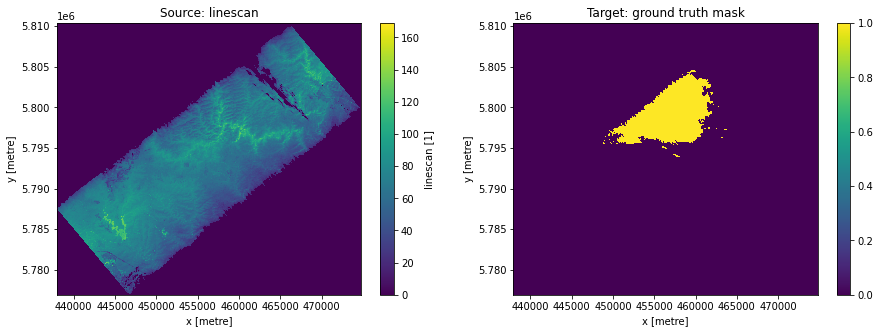

Linescan ID: 61
Rasterizing to match xarray.DataArray dimensions (3366, 3783)


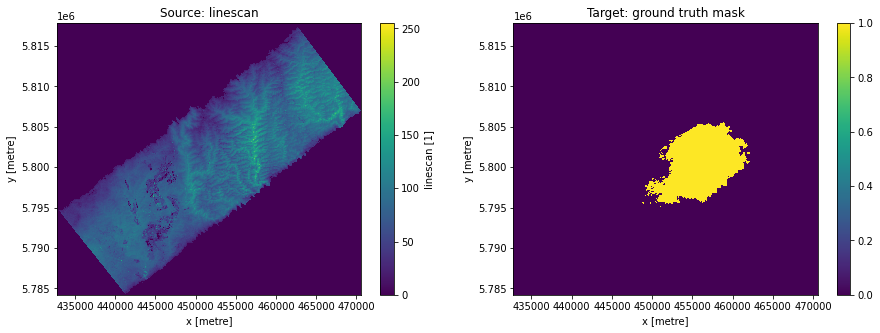

In [ ]:
for linescan_id in matches.id_ls.unique():
    print("Linescan ID:", linescan_id)
    ob = gdf.loc[gdf.ID.isin(matches[matches.id_ls == linescan_id].id_pl)]
    src = dc.load(product='linescan', id=linescan_datasets[linescan_id].id, output_crs='epsg:28355', resolution=(-10,10))
    tgt = xr_rasterize(gdf=ob, da=src)
    ### tu obcinam wystajace obszary
    tgt.values[src.linescan.values[0] == 0.0] = 0
    ###
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    src.linescan.plot(ax=ax[0])
    ax[0].set_title('Source: linescan')
    tgt.plot(ax=ax[1])
    ax[1].set_title('Target: ground truth mask')
    plt.show()

In [ ]:
matches['good'] = np.repeat(True, len(matches))
matches.loc[matches.id_ls.isin([65,79,88,94,105,112,118,124,133,54,58,98,100,101,102,103,116,129,132,75,76,77]),'good'] = np.repeat(False, len(matches[matches.id_ls.isin([65,79,88,94,105,112,118,124,133,54,58,98,100,101,102,103,116,129,132,75,76,77])]))

Final size of our dataset:

In [ ]:
print("Number of pictures with marked fire boundaries:",len(matches.loc[matches.good == 1].id_ls.unique()))
print("Number of correct polygon-linescan linkages:",len(matches.loc[matches.good == 1]))

Number of pictures with marked fire boundaries: 38
Number of correct polygon-linescan linkages: 957


## Conclusions

1. Both dataset are provided from two independent institutions. They are really messy and difficult to deal with. Data preparation took 80% of time spent on this project.
2. Finally we get only 38 pictures with fire boundaries as training set. It is very small number. We had to make data augmentation, such as rotations, symmetries etc. 

# Code that utilizes Pytorch-UNet


Source for the Pytorch-UNet: https://github.com/milesial/Pytorch-UNet

## Imports

In [ ]:
%matplotlib inline
import sys
import torch
import xarray
import numpy as np
import pandas as pd
import geopandas as gpd
import torchvision.models as models
import matplotlib.pyplot as plt

from PIL import Image
from datetime import datetime
from datacube import Datacube
from dea_plotting import map_shapefile
from dea_spatialtools import xr_rasterize

## Opening datacube and saving images and masks to proper paths

Since our data is form Open Data Cube app we have to do some basic data imports at first.

In [ ]:
dc = Datacube(app='First tries of modelling')

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [ ]:
linescan_datasets = dc.find_datasets(product='linescan')
linescan_datasets = sorted(linescan_datasets, key = lambda ds: (ds.center_time, ds.id))

In [ ]:
vector_file = 'resources/fire_boundaries.shp'
gdf = gpd.read_file(vector_file)

Utilizing matches of linescans and targets made before to make training set. It really only makes sense to do this on only 38 images, sadly.

In [ ]:
matches = pd.read_csv('matches2.csv')
matches = matches[matches['good'] == 1]

In [ ]:
train_targets_regions = []
for k in range(134):
    if k not in set(matches['id_ls']):
        continue
    
    df = matches.loc[matches['id_ls'] == k]
    print(f'Working on {k}...')
    src = dc.load(
        product='linescan', 
        id=linescan_datasets[k].id, 
        output_crs='epsg:28355', 
        resolution=(-10,10)
    )

    region = gdf.loc[df['id_pl']]
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
    plt.axis('off')
    
    target = xr_rasterize(gdf=region, da=src)
    target.values[src.linescan.values[0] == 0] = 0
    train_targets_regions.append(target)
    ax.imshow(src.linescan[0, :, :])
    # region.geometry.exterior.plot(ax=ax, edgecolor='red', linewidths=1)
    # plt.gca().collections[-1].colorbar.remove()
    plt.title('')
    data = np.array(src.linescan.data)[0, :, :]
    
    Image.fromarray(data).save(f'data/imgs/linescan_{k}.png')
    plt.show()

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

    plt.axis('off')
    ax.imshow(train_targets_regions[-1])
    print(train_targets_regions[-1].sum()/(1-train_targets_regions[-1]).sum())
    Image.fromarray(train_targets_regions[-1].data).save(f'data/masks/linescan_{k}.png')
    plt.show()

## Augmentation of train set with Augmentor package

Since we have only 38 images in training set, we have to augment the data in proper way. We don't want to distort the images blindly. We want only affine transformation such as: roatation, zooming, translating and skewing. 

To perform data augmentation we will use [Augmentor](https://github.com/mdbloice/Augmentor) package which provides easy to write and read code for this exact problem. Afterwards we can easily save desired number of augmented images.

In [ ]:
import Augmentor
import os
from pathlib import Path

In [ ]:
img_path = lambda k: f'data/imgs/linescan_{k}.png'
mask_path = lambda k: f'data/masks/linescan_{k}.png'

images = [
    [
        np.asarray(Image.open(img_path(k))),
        np.asarray(Image.open(mask_path(k))),
    ]
    for k in set(matches['id_ls'])
]

In [ ]:
p = Augmentor.DataPipeline(images)
p.rotate_random_90(probability=0.8)
p.flip_left_right(probability=0.8)
p.flip_top_bottom(probability=0.8)
p.skew(probability=0.8)
p.zoom(probability=0.8, min_factor=1.1, max_factor=1.3)

In [ ]:
# it takes about ~40min on 12GB GPU, but it works amazingly
sample_aug_imgs = p.sample(500)

In [ ]:
for i, augmented_imgs in enumerate(sample_aug_imgs):
    print(f"Saving image: {i}")
    img, mask = augmented_imgs
    
    Image.fromarray(img).save(f'data/imgs/linescan_aug_{i}.png')
    Image.fromarray(mask).save(f'data/masks/linescan_aug_{i}.png')

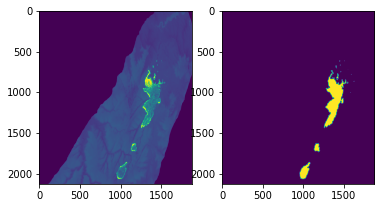

In [ ]:
im_ls = Image.open('data/imgs/linescan_aug_369.png')
im_ms = Image.open('data/masks/linescan_aug_369.png')
fig, axs = plt.subplots(nrows=1, ncols=2)

axs[0].imshow(np.asarray(im_ls))
axs[1].imshow(np.asarray(im_ms))

## Reading the test set and saving to proper paths

In [ ]:
test = pd.read_csv('resources/challenge1_test.csv', index_col='id')
fnames = test.label.unique()
fnames

array(['JORDAN_235_P1_201901281204_MGA94_55',
       'JORDAN_294_P1_201902011150_MGA94_55',
       'WALHALLA_313_P1_201902020733_MGA94_55',
       'WALHALLA_353_P1_201902031625_MGA94_55',
       'MACALISTER91_648_P1_201903070444_MGA94_55'], dtype=object)

In [ ]:
dc = Datacube(app='Model Training')

linescan_datasets = dc.find_datasets(product='linescan')
linescan_datasets = sorted(linescan_datasets, key = lambda ds: (ds.center_time, ds.id))

ls_labels = [
    linescan_datasets[k].metadata_doc['label'] for k in range(len(linescan_datasets))
]

test_df = pd.read_csv('resources/challenge1_test.csv', index_col='id')

test_ids_in_linescan_ds = [
    k for k in range(len(linescan_datasets)) if ls_labels[k] in test_df['label'].tolist()
]

test_ds_list = {
    k: dc.load(product='linescan',
                id=linescan_datasets[k].id,
                output_crs='epsg:28355',
                resolution=(-10,10))
        for k in test_ids_in_linescan_ds
}

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


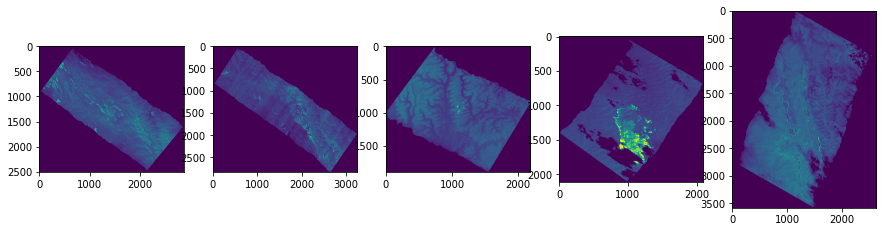

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=5)
fig.set_size_inches(15, 8)
for i, k in enumerate(test_ids_in_linescan_ds):
    src = test_ds_list[k]
    data = np.array(src.linescan[0, :, :].data)
    axs[i].imshow(data)
    Image.fromarray(data).save(f'test/imgs/linescan_{k}.png')

Above we can see our test images. For all of them, except the fourth one we can see that it is hard to find the fire spots.

## Training our model and saving it

This time we will use customized implementation of this [U-Net](https://arxiv.org/abs/1505.04597). The implementation is made by [milesial](https://github.com/milesial), user of GitHub. The code is open-source and is known to have a lot of succes for kaggle competition. The model is made of 4 "Downs" and 4 "Ups" layers, from which every is made out of 2 2D convolutional layers, moreover Ups have one more Upsample layer to scale the output up. Additionally there are 2 2D convolutional layers at the begining and one at the end. To sum up we have a deep neural net made out of 21 layers with ReLU as activation function and batch normalization between them. We can see how the model looks like on the picture below (credit to the authors of the paper above.)

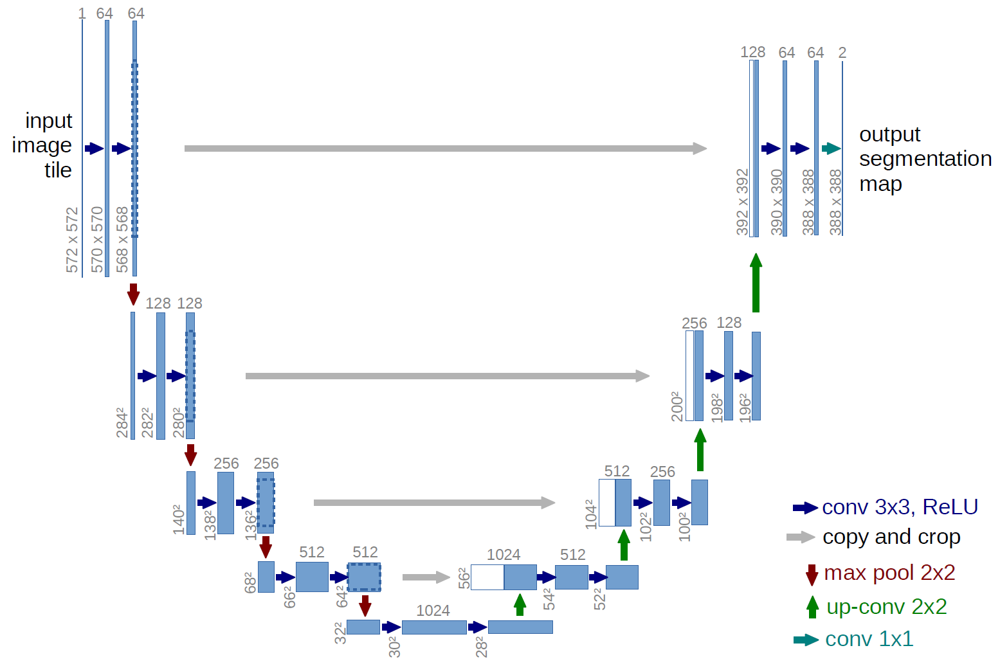

We will train the model with 538 images split to train and validation set. Our test set is 5 images provided to us by EY. We can deliver dice loss on our train and validation set, however we cannot do it for the test set since we don't have masks of those images. The training it taking a lot of time, so we can use one, pre-trained by us on our images. However we slightly changed the hyperparameters of the given model. We are using 1 color images, not RGB ones, so we can take that into account and save some time on training with limited calculations. Furthermore we are training our model for minimizing Binary Cross Entropy with logits, since our data is in one color only i.e. it has one input channel.

Since the module with model is provided by cloning the github repo it is more convinent to train the model with terminal command.

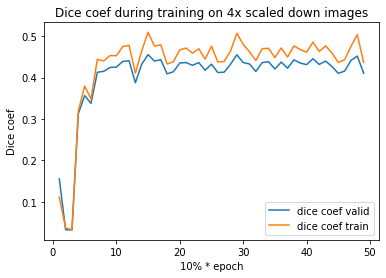

In [ ]:
loss_valid = pd.read_csv('dice_loss_train.csv')
loss_train = pd.read_csv('dice_loss_valid.csv')
x = loss_valid.index + 1

plt.plot(x, loss_valid, label='dice coef valid')
plt.plot(x, loss_train, label='dice coef train')
plt.xlabel('10% * epoch')
plt.ylabel('Dice coef')
plt.title('Dice coef during training on 4x scaled down images')
plt.legend()
plt.show()

As we see on the plot our model trained on images scaled down 4x is stuck at ~0.45 dice coef.

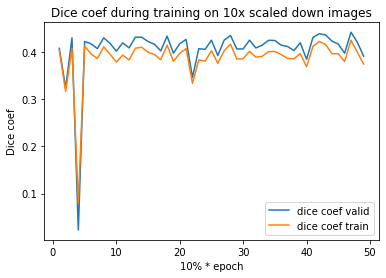

In [ ]:
loss_valid = pd.read_csv('dice_loss_train_025.csv')
loss_train = pd.read_csv('dice_loss_valid_025.csv')
x = loss_valid.index + 1

plt.plot(x, loss_valid, label='dice coef valid')
plt.plot(x, loss_train, label='dice coef train')
plt.xlabel('10% * epoch')
plt.ylabel('Dice coef')
plt.title('Dice coef during training on 10x scaled down images')
plt.legend()
plt.show()

## After training start this to do the prediction and save it as .csv

For the EY challenge we used model trained with 10 epochs on 1 color images scaled down 5x times.

In [ ]:
for k in test_ids_in_linescan_ds:
    os.system(f"python predict.py -i test/imgs/linescan_{k}.png -o test/masks/linescan_{k}.png -s 0.2 -m MODEL_UNET_1500.pth")

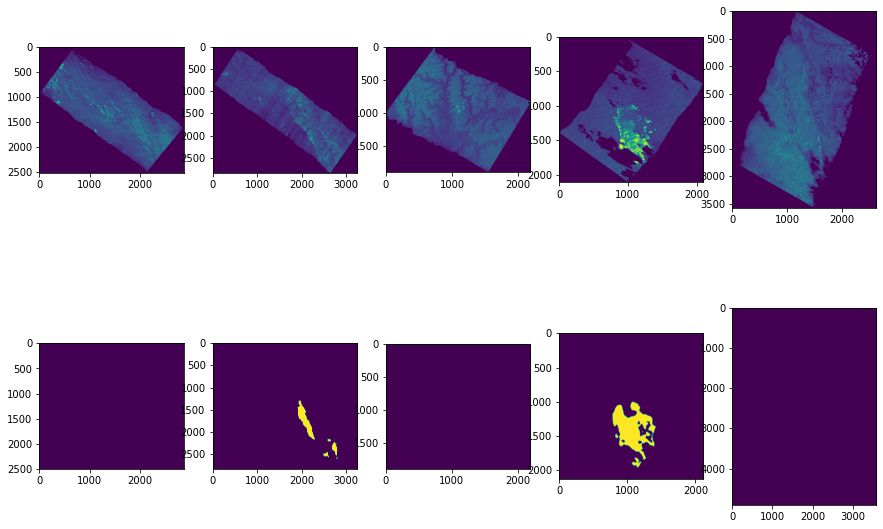

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=5)
fig.set_size_inches(15, 10)
for i, k in enumerate(test_ids_in_linescan_ds):
    src = test_ds_list[k]
    data = np.array(src.linescan[0, :, :].data)
    axs[0][i].imshow(data)
    mask = np.asarray(Image.open(f'test/masks/linescan_{k}.png'))
    axs[1][i].imshow(mask)

As we can see on the plot above, this model is only identifying fires on the 2nd and 4th test images. To be honest, we have no idea if it is correct, but it scored **0.56** with EY metric which is F1 score. But the problem with F1 score in general is that EY only looked at chosen 5000 pixels, not on all of them. For this reason we have used Dice coefficient for cheking out how well training is performing.

The code below is to make .csv file wanted by EY competition system for easy evaluation of prediction.

In [ ]:
for i, k in enumerate(test_ids_in_linescan_ds):
    print(i)
    current_data = test_ds_list[k]
    
    x_org, y_org = np.asarray(Image.open(f'test/imgs/linescan_{k}.png')).shape
    output = np.asarray(Image.open(f'test/masks/linescan_{k}.png'))
    print(x_org, y_org, output.shape)
    if x_org <= output.shape[0] and y_org <= output.shape[1]:
        output = output[:x_org, :y_org]
        output = output[None, :, :]
    else:
        canvas = np.zeros((x_org, y_org))
        canvas[:output.shape[0], :output.shape[1]] = output
        output = canvas[None, :, :]

    
    # Uncomment if masks should be cropped to "borders"
#     output = output_border_cropped
    
    mask = (output > 0).astype(np.uint8) # the mask
    mask_xarray = current_data.copy(data={'linescan': mask})
    
    for idx, ob in test_df[test_df.label == ls_labels[k]].iterrows():
        result_tf = mask_xarray.sel(x=ob.x, y=ob.y, method='nearest').linescan[0]
        result_10 = int(result_tf == True)
        test_df.loc[(test_df.label==ls_labels[k]) & (test_df.x==ob.x) & (test_df.y==ob.y), 'target'] = result_10

test_df.to_csv('challenge1_bartek_unet_aug_10epoch_20210615_2330.csv', columns = ['target'])

# Model based on other UNet architecture

## Foreword

For easier usage, input data for this model was preprocessed and stored as a single `ls_dataset.pickle` file. It can be downloaded from [here](https://drive.google.com/drive/folders/1cbPVylrvCkNg8g8a0T990qxtGH7vPy8_?usp=sharing). Due to it's size (8GB uncompressed), the file is provided as a small gzip archive.

## Imports

In [ ]:
%pylab inline
import sys
import numpy as np
import torch, torchvision
import torch.optim as optim
import torchvision.models as models
from torchvision import transforms
import matplotlib.pyplot as plt

assert torch.cuda.is_available()

device = 'cuda'

Populating the interactive namespace from numpy and matplotlib


## Model architecture

Small helper classes

In [ ]:
class NoneTransform(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, img):
        return img

class CustomDataset(torch.utils.data.Dataset):

    def __init__(self, dataset, transform = NoneTransform(), target_transform = NoneTransform()):
        self.dataset = dataset
        
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        inp, out = self.dataset[idx]
        return (self.transform(inp[None]), self.target_transform(out[None]))

#### Proper model architecture - based on work of Mateusz Buda.

We initially used it pre-trained  with Mateusz's weights, but later on trained the modely fully by ourselves.

Suprisingly, his model out of the box worked quite well with our task and received EY score of ~0.21 - for context, it was ~0.10 for plain thresholding of bright pixels and ~0.63 for Mateusz's UNet but full trained on our data.

<img src="https://raw.githubusercontent.com/mateuszbuda/brain-segmentation-pytorch/master/assets/unet.png" height="500" alt="Mateusz Buda's UNet architecture">

see more: <a href="https://github.com/mateuszbuda/brain-segmentation-pytorch">https://github.com/mateuszbuda/brain-segmentation-pytorch</a>

In [ ]:
class LineUNet(torch.nn.Module):
    
    def __init__(self, usePretrained = True, in_channels = 3, init_features = 32):
        super(LineUNet, self).__init__()

        if usePretrained:
            from PIL import Image
            import urllib
            url, filename = ("https://github.com/mateuszbuda/brain-segmentation-pytorch/raw/master/assets/TCGA_CS_4944.png", "TCGA_CS_4944.png")
            urllib.request.urlretrieve(url, filename)
            input_image = Image.open(filename)
            m, s = np.mean(input_image, axis=(0, 1)), np.std(input_image, axis=(0, 1))
            
            self.preprocess = transforms.Compose([
                transforms.Resize((256, 256)),
                transforms.Lambda(lambda x: x.repeat(1, in_channels, 1, 1)),
                transforms.Normalize(mean = m, std = s),
            ])
        else:
            self.preprocess = transforms.Compose([
                # intentionally blank
            ])

        self.unet = torch.hub.load('mateuszbuda/brain-segmentation-pytorch', 'unet', 
                                   in_channels=in_channels, out_channels=1, init_features=init_features,
                                   pretrained = usePretrained)
    
    def forward(self, x):
        x = self.preprocess(x)
        x = self.unet(x)
        return x

In contrast to the previous model, here we use Dice loss which derivates from Dice coefficient used in the previous model's training. 

In [ ]:
# Source: https://github.com/mateuszbuda/brain-segmentation-pytorch/
class DiceLoss(torch.nn.Module):

    def __init__(self):
        super(DiceLoss, self).__init__()
        self.smooth = 1.0

    def forward(self, y_pred, y_true):
        assert y_pred.size() == y_true.size()
        y_pred = y_pred[:, 0].contiguous().view(-1)
        y_true = y_true[:, 0].contiguous().view(-1)
        intersection = (y_pred * y_true).sum()
        dsc = (2. * intersection + self.smooth) / (
            y_pred.sum() + y_true.sum() + self.smooth
        )
        return 1. - dsc

## Utilities

We prepared facilities for saving checkpoints during training as well as storing models for later use.

In [ ]:
# Based on: medium.com/analytics-vidhya/saving-and-loading-your-model-to-resume-training-in-pytorch-cb687352fa61

def save_ckp(checkpoints_dir, epoch, model, optimizer, is_best = False, only_best_for_best = False, save_optimizer = True):
    import shutil
    from datetime import datetime
    
    state = {
        'epoch': epoch,
        'state_dict': model.state_dict()
    }
    
    if save_optimizer:
        state['optimizer'] = optimizer.state_dict()
    
    if is_best and not only_best_for_best:
        f_path = checkpoints_dir / f'checkpoint_{datetime.now()}.pt'
        torch.save(state, f_path)
    
    if is_best:
        best_fpath = checkpoints_dir / 'best_model.pt'
        torch.save(state, best_fpath)

def load_ckp(checkpoint_fpath, model, optimizer):
    checkpoint = torch.load(checkpoint_fpath)
    model.load_state_dict(checkpoint['state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer'])
    return model, optimizer, checkpoint['epoch']

def load_model_from_ckp(checkpoint_fpath, model):
    checkpoint = torch.load(checkpoint_fpath)
    model.load_state_dict(checkpoint['state_dict'])
    return model, checkpoint['epoch']

In [ ]:
from pathlib import Path
import os    

CHECKPOINTS_DIR = 'chpts'
if not os.path.exists(CHECKPOINTS_DIR):
    os.makedirs(CHECKPOINTS_DIR)

## Model training

Training process

In [ ]:
def train(model, trainloader, validloader, device = 'cpu', nepoch = 10):
    criterion = DiceLoss()
    optimizer = optim.Adam(model.parameters(), lr = 0.001)

    transform = transforms.RandomApply(torch.nn.ModuleList([
        transforms.RandomAffine(degrees = 20, translate = (0.05, 0.05), scale = (0.95, 1.05), shear = 10)
    ]), p = 0.5)
    model.to(device)

    best_loss = np.inf

    for epoch in range(nepoch):
        ##### TRAINING #####
        model.train()
        train_loss, train_count = 0.0, 0
        
        for i, data in enumerate(trainloader, 0):
            linescans, outlines = data

            augmented = transform(torch.vstack([linescans, outlines]))
            inputs = augmented[:augmented.shape[0] // 2]
            labels = augmented[augmented.shape[0] // 2:]

            optimizer.zero_grad()

            outputs = model(inputs.to(device))
            loss = criterion(outputs, (transforms.Resize((imsz, imsz))(labels)).to(device))
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * len(inputs)
            train_count += len(inputs)
            
        
        ##### VALIDATION #####
        with torch.no_grad():
            model.eval()
            valid_loss, valid_count = 0.0, 0
            
            for i, data in enumerate(validloader, 0):
                linescans, outlines = data
                
                outputs = model(linescans.to(device))
                loss = criterion(outputs, outlines.to(device))
            
                valid_loss = loss.item() * len(linescans)
                valid_count += len(linescans)
                
        ##### LOGGING #####
        current_loss = valid_loss / valid_count
        
        print(f'[{epoch+1}/{nepoch}] Losses:'
              f' {train_loss / train_count * 100 : .3f} (train),'
              f' {valid_loss / valid_count * 100 : .3f} (valid)', end = '')
        
        if best_loss > current_loss:
            print(', best')
        else:
            print('')
        
        if best_loss > current_loss or (epoch > 0 and epoch % 10 == 0):
            save_ckp(Path(CHECKPOINTS_DIR), epoch+1, model, optimizer, is_best = best_loss > current_loss,
                     only_best_for_best = True, save_optimizer = False)

        if best_loss > current_loss:
            best_loss = current_loss

    print(f'Finished Training. Best loss was: {best_loss} (valid)')

Training and validation data loading

In [ ]:
import pickle
from sklearn.model_selection import train_test_split

train_data, valid_data = train_test_split(
    pickle.load(open("ls_dataset.pickle", "rb")),
    test_size = 0.3
)

Initialize DataLoaders

In [ ]:
imsz = 320

transform = transforms.Resize((imsz, imsz))
target_transform = transforms.Resize((imsz, imsz))

trainloader = torch.utils.data.DataLoader(
    CustomDataset(train_data, transform = transform, target_transform = target_transform),
    batch_size = 16,
    shuffle = True
)

validloader = torch.utils.data.DataLoader(
    CustomDataset(valid_data, transform = transform, target_transform = target_transform),
    batch_size = 16,
    shuffle = False
)

Train the model

In [ ]:
model = LineUNet(usePretrained = False, in_channels = 1, init_features = 48)
train(model, trainloader, validloader, device = 'cuda', nepoch = 50)

Using cache found in /home/jovyan/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


[1/50] Losses:  80.336 (train),  39.523 (valid), best
[2/50] Losses:  79.830 (train),  39.455 (valid), best
[3/50] Losses:  78.132 (train),  39.212 (valid), best
[4/50] Losses:  75.643 (train),  39.230 (valid)
[5/50] Losses:  72.800 (train),  39.092 (valid), best
[6/50] Losses:  71.704 (train),  39.196 (valid)
[7/50] Losses:  72.852 (train),  38.626 (valid), best
[8/50] Losses:  73.604 (train),  39.406 (valid)
[9/50] Losses:  72.783 (train),  38.801 (valid)
[10/50] Losses:  68.189 (train),  38.587 (valid), best
[11/50] Losses:  70.344 (train),  39.138 (valid)
[12/50] Losses:  69.334 (train),  38.760 (valid)
[13/50] Losses:  66.459 (train),  38.364 (valid), best
[14/50] Losses:  66.008 (train),  38.225 (valid), best
[15/50] Losses:  64.735 (train),  38.198 (valid), best
[16/50] Losses:  65.554 (train),  36.026 (valid), best
[17/50] Losses:  64.837 (train),  38.450 (valid)
[18/50] Losses:  65.306 (train),  37.864 (valid)
[19/50] Losses:  63.999 (train),  39.877 (valid)
[20/50] Losses:  6

## Visually inspect how the model performs

In the EY contest, this model received a score of 0.63679 (where 1.0 is max). For information on how the models were evaluated in the contest, please see notes in Bartek's section about previous UNet model.

Load best model (in terms of validation loss)

In [ ]:
best_model = LineUNet(usePretrained = False, in_channels = 1, init_features = 48)
best_model, best_epoch = load_model_from_ckp(Path(CHECKPOINTS_DIR) / 'best_model.pt', best_model)

Using cache found in /home/jovyan/.cache/torch/hub/mateuszbuda_brain-segmentation-pytorch_master


Let's see how it performs on random examples

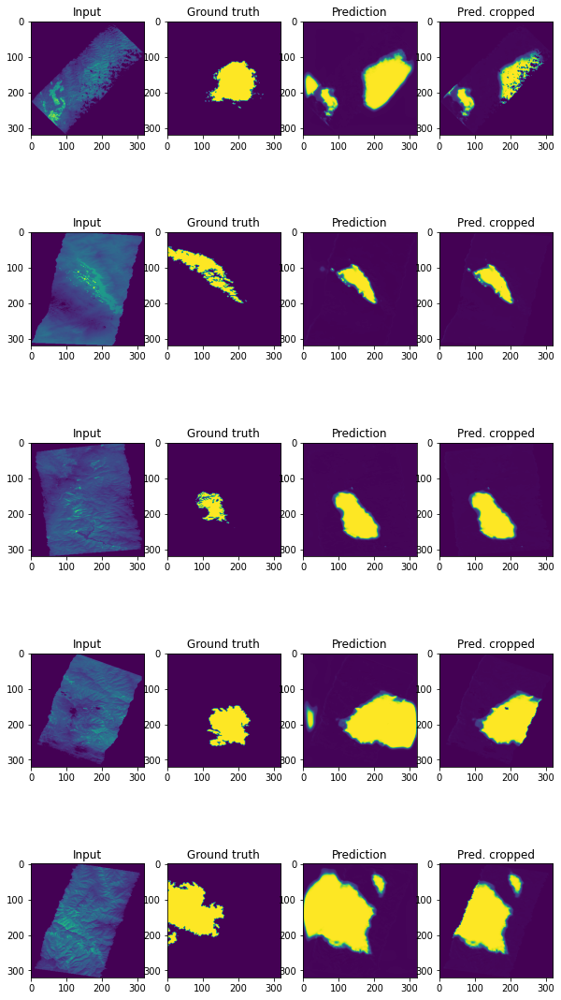

In [ ]:
n = 5
fig, ax = plt.subplots(nrows = n, ncols = 4)
fig.set_size_inches(10, 4 * n)

best_model.eval()
best_model.to('cpu')
for i, idx in enumerate(torch.randperm(len(trainloader.dataset))[:5]):
    x, y = trainloader.dataset[idx]

    ax[i, 0].imshow(x.detach().numpy()[0])
    ax[i, 1].imshow(y.detach().numpy()[0])
    
    predicted = best_model(x[None]).detach().numpy()[0,0]
    
    ax[i, 2].imshow(predicted)
    
    predicted[x.detach().numpy()[0] == 0.0] = 0
    
    ax[i, 3].imshow(predicted)
    
    ax[i,0].set_title("Input")
    ax[i,1].set_title("Ground truth")
    ax[i,2].set_title("Prediction")
    ax[i,3].set_title("Pred. cropped")